In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
from PIL import Image


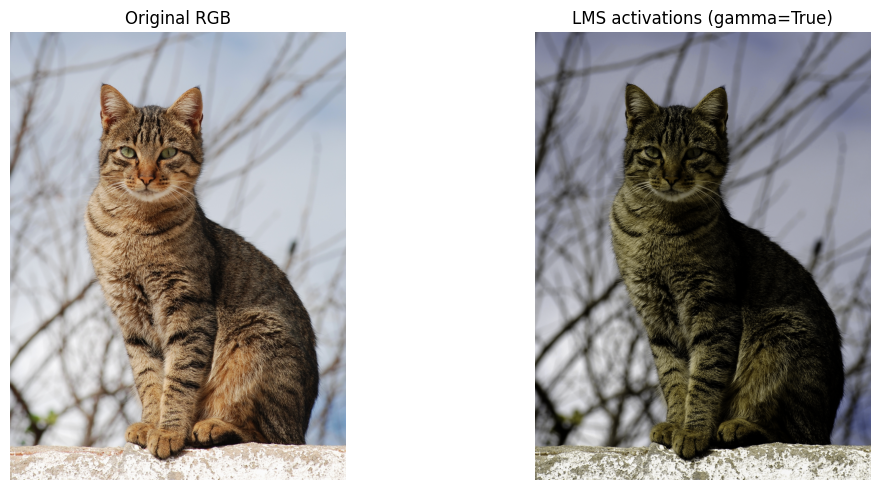

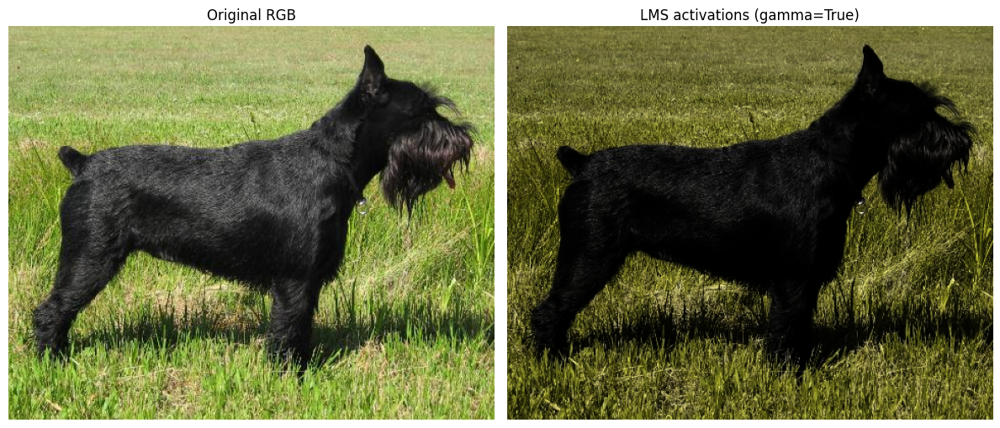

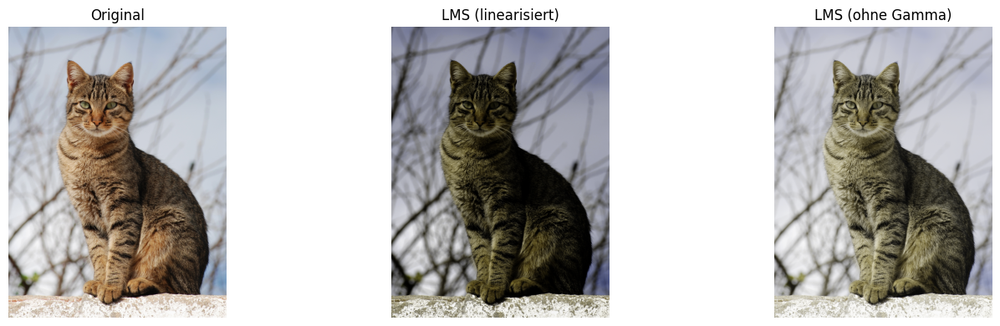

In [2]:
import numpy as np
import matplotlib.pyplot as plt

def uniform_sphere_points(n=5000, r=1.0, cut=0.4, noise=0.0, plot=False):

    y_cut = -(r - r * cut)
    y_cut_norm = y_cut / r
    
    golden_angle = np.pi * (3.0 - np.sqrt(5.0))
    points = []
    
    for i in range(n):
        t = i / (n - 1) if n > 1 else 0.5
        y = 1.0 - t * (1.0 - y_cut_norm)
        theta = golden_angle * i
        if noise > 0:
            y += np.random.uniform(-1, 1) * noise
            theta += np.random.uniform(-1, 1) * noise * np.pi
            y = np.clip(y, y_cut_norm, 1.0)
            
        radius_xz = np.sqrt(max(0, 1.0 - y**2))
        
        x = np.cos(theta) * radius_xz * r
        z = np.sin(theta) * radius_xz * r

        points.append([x, y * r, z])
        
    points = np.array(points)

    if plot:
        fig = plt.figure(figsize=(8, 8))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(points[:, 0], points[:, 1], points[:, 2], s=2)
        plt.show()
        
    return points


def rgb_to_lms(image_path: str, linearize_gamma: bool = True, gamma: float = 2.2) -> np.ndarray:

    img = Image.open(image_path).convert('RGB')
    rgb = np.array(img, dtype=np.float32) / 255.0
    
    if linearize_gamma:
        rgb = np.power(rgb, gamma)
    
    rgb_to_lms_matrix = np.array([
        [0.31399, 0.63951, 0.04649],  # L
        [0.15537, 0.75789, 0.08670],  # M
        [0.01775, 0.10944, 0.87262],  # S
    ], dtype=np.float32)
    
    lms = rgb @ rgb_to_lms_matrix.T
    
    lms = np.clip(lms, 0.0, 1.0)
    
    return lms


def visualize_comparison(image_path: str, linearize_gamma: bool = True):
    original = np.array(Image.open(image_path).convert('RGB'))
    lms = rgb_to_lms(image_path, linearize_gamma=linearize_gamma)
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    axes[0].imshow(original)
    axes[0].set_title('Original RGB')
    axes[0].axis('off')
    
    axes[1].imshow(lms)
    axes[1].set_title(f'LMS activations (gamma={linearize_gamma})')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()



visualize_comparison('cat.jpg', linearize_gamma=True)

visualize_comparison('dog.jpg', linearize_gamma=True)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

original = np.array(Image.open('cat.jpg').convert('RGB'))
lms_linear = rgb_to_lms('cat.jpg', linearize_gamma=True)
lms_raw = rgb_to_lms('cat.jpg', linearize_gamma=False)

axes[0].imshow(original)
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(lms_linear)
axes[1].set_title('LMS (linearisiert)')
axes[1].axis('off')

axes[2].imshow(lms_raw)
axes[2].set_title('LMS (ohne Gamma)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

Shape des Output-Arrays: (2397, 1795)
Min Value: 0.0000, Max Value: 0.9956


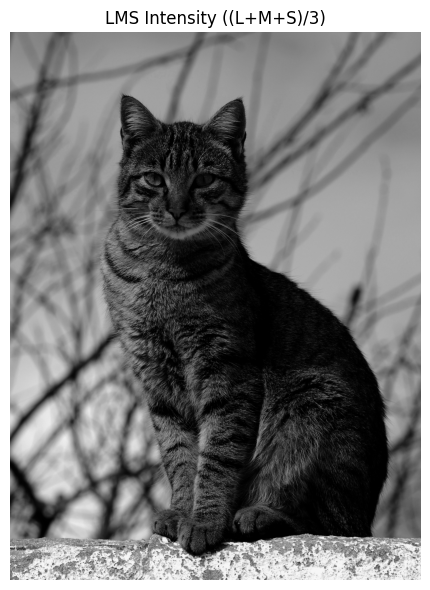

In [3]:
def lms_to_intensity(lms_array: np.ndarray) -> np.ndarray:

    intensity = np.mean(lms_array, axis=2)

    intensity = np.clip(intensity, 0.0, 1.0)
    
    return intensity

def visualize_single_channel(image_path: str):
    lms_data = rgb_to_lms(image_path, linearize_gamma=True)
    
    intensity_data = lms_to_intensity(lms_data)
    
    print(f"Shape des Output-Arrays: {intensity_data.shape}")
    print(f"Min Value: {np.min(intensity_data):.4f}, Max Value: {np.max(intensity_data):.4f}")

    plt.figure(figsize=(6, 6))
    plt.imshow(intensity_data, cmap='gray', vmin=0, vmax=1)
    plt.title('LMS Intensity ((L+M+S)/3)')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

visualize_single_channel('cat.jpg')

In [4]:
import cv2

def video_frame_generator(video_path, loop=False):

    cap = cv2.VideoCapture(video_path)
    
    if not cap.isOpened():
        raise IOError(f"Couldn't find '{video_path}'.")
    
    try:
        while True:
            ret, frame = cap.read()
            
            if not ret:
                if loop:
                    cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
                    continue
                else:
                    break
            
            
            yield frame
            
    finally:
        cap.release()

In [5]:
def plot_point_sets(data, title: str = "3D view", point_size: float = 2.0, alpha: float = 0.6):

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    if isinstance(data, np.ndarray):
        data_to_plot = {"Data": data}
    elif isinstance(data, dict):
        data_to_plot = data
    else:
        raise ValueError("data must be np.ndarray or dict.")
        
    all_coords = []
    for label, points in data_to_plot.items():
        if isinstance(points, np.ndarray) and points.ndim == 2 and points.shape[1] == 3:
            
            if len(points) > 0:
                ax.scatter(points[:, 0], points[:, 1], points[:, 2], 
                           s=point_size, label=label, alpha=alpha)
                
                all_coords.append(points)
        else:
            pass 

    if all_coords:
        combined = np.vstack(all_coords)
        max_range = np.array([combined[:,0].max()-combined[:,0].min(), 
                              combined[:,1].max()-combined[:,1].min(), 
                              combined[:,2].max()-combined[:,2].min()]).max() / 2.0

        mid_x = (combined[:,0].max()+combined[:,0].min()) * 0.5
        mid_y = (combined[:,1].max()+combined[:,1].min()) * 0.5
        mid_z = (combined[:,2].max()+combined[:,2].min()) * 0.5

        ax.set_xlim(mid_x - max_range, mid_x + max_range)
        ax.set_ylim(mid_y - max_range, mid_y + max_range)
        ax.set_zlim(mid_z - max_range, mid_z + max_range)

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(title)
    ax.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

In [6]:
def uniform_cap_points(n: int, r: float = 1.0, angle_deg: float = 10.0, noise: float = 0.0) -> np.ndarray:
    if n <= 0:
        return np.array([]).reshape(0, 3)
    
    angle_rad = np.radians(angle_deg)
    y_min, y_max = np.cos(angle_rad), 1.0
    golden_angle = np.pi * (3.0 - np.sqrt(5.0))
    
    points = []
    for i in range(n):
        t = i / (n - 1) if n > 1 else 0.5
        y = y_max - t * (y_max - y_min)
        theta = golden_angle * i
        
        if noise > 0:
            y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
            theta += np.random.uniform(-1, 1) * noise * np.pi
        
        radius_xz = np.sqrt(max(0, 1.0 - y**2))
        points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
    
    return np.array(points)


In [7]:
cap = uniform_cap_points(n=20000,r=0.7,angle_deg=140,noise=0.3)

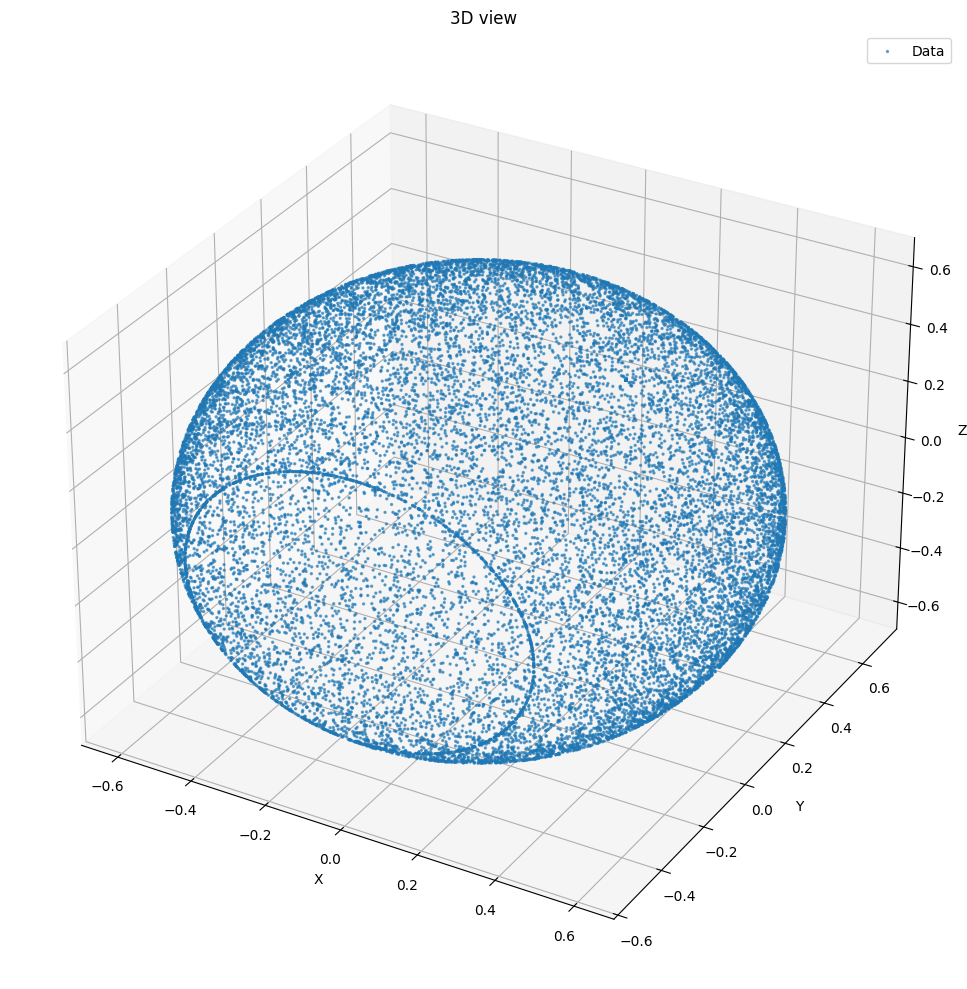

In [8]:
plot_point_sets(cap)

In [9]:
def uniform_sphere_band(n: int, r: float = 1.0, angle_start_deg: float = 1.2, 
                        angle_end_deg: float = 30.0, noise: float = 0.0) -> np.ndarray:
    if n <= 0:
        return np.array([]).reshape(0, 3)
    
    y_max = np.cos(np.radians(angle_start_deg))
    y_min = np.cos(np.radians(angle_end_deg))
    
    if y_min >= y_max:
        raise ValueError(f"Pronlem with angles: start={angle_start_deg}° end={angle_end_deg}°")
    
    golden_angle = np.pi * (3.0 - np.sqrt(5.0))
    
    points = []
    for i in range(n):
        t = i / (n - 1) if n > 1 else 0.5
        y = y_max - t * (y_max - y_min)
        theta = golden_angle * i
        
        if noise > 0:
            y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
            theta += np.random.uniform(-1, 1) * noise * np.pi
        
        radius_xz = np.sqrt(max(0, 1.0 - y**2))
        points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
    
    return np.array(points)

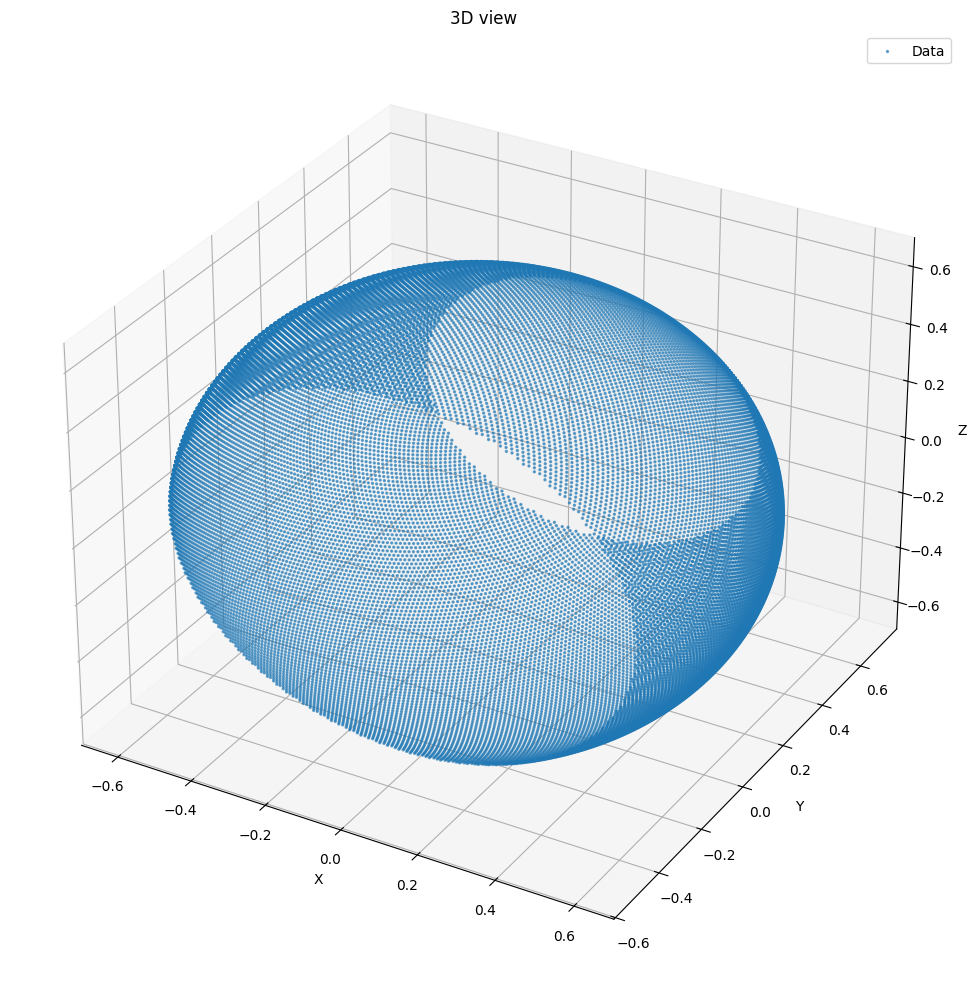

In [10]:
sphere_band = uniform_sphere_band(n=30000,r=0.7,angle_start_deg=40,angle_end_deg=120)
plot_point_sets(sphere_band)

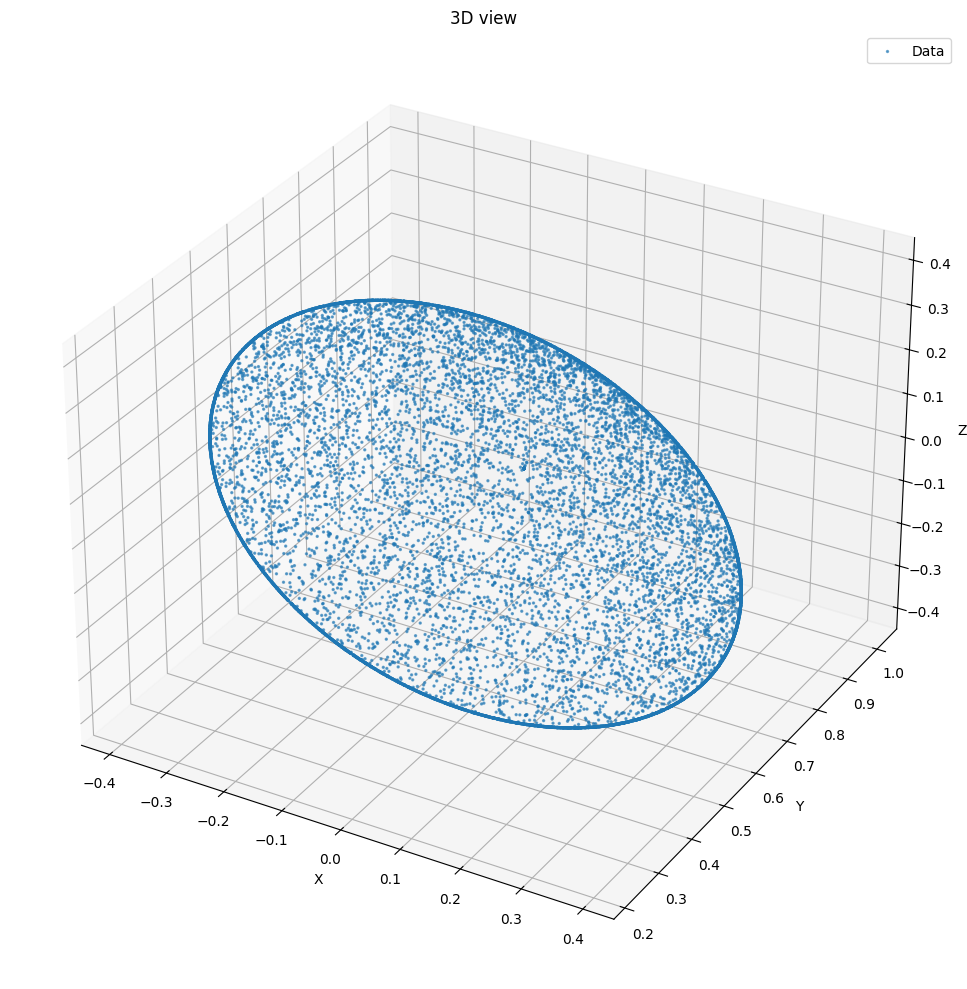

In [11]:
cap = uniform_cap_points(n=20000,r=0.7,angle_deg=40,noise=0.3)
plot_point_sets(cap)

In [12]:
def inner_layer(n_band=4400,n_foveola=5000,r=0.7,angle_start_deg=40,angle_end_deg=120,noise=0.3,concat=True):
    sphere_band = uniform_sphere_band(n=n_band,r=r,angle_start_deg=angle_start_deg,angle_end_deg=angle_end_deg,noise=noise)
    cap = uniform_cap_points(n=n_foveola,r=r,angle_deg=angle_start_deg,noise=noise)
    if concat:
        return np.concatenate((sphere_band, cap), axis=0)
    else:
        return (sphere_band, cap)
    

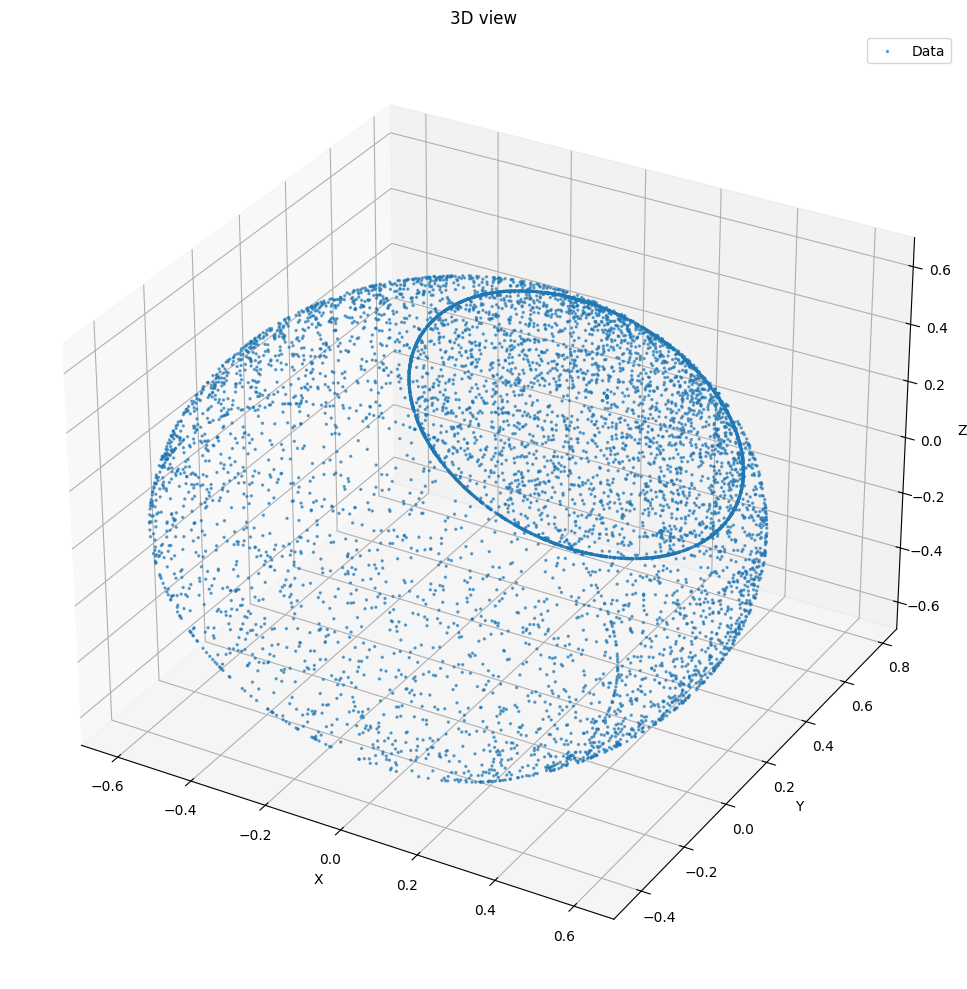

In [13]:
plot_point_sets(inner_layer())

In [14]:

DEFAULT_PARAMS = {
    'layer_count': 20000,
    
    'rod_ratio': 0.952,
    'L_ratio': 0.030,
    'M_ratio': 0.015,
    'S_ratio': 0.003,
    
    'foveola_L_ratio_base': 0.004,
    'foveola_M_ratio_base': 0.004,
    'foveola_angle_base_deg': 0.6,
    'foveola_max_ratio': 0.5,
    
    'foveola_angle_deg': 0.6,
    'iris_angle_deg': 110.0,
    
    'radius': 1.0,
    'noise': 0.02,
}


def _spherical_cap_area(angle_deg: float) -> float:
    return 1.0 - np.cos(np.radians(angle_deg))


def _compute_foveola_ratios(p: dict) -> tuple:
    base_area = _spherical_cap_area(p['foveola_angle_base_deg'])
    current_area = _spherical_cap_area(p['foveola_angle_deg'])
    
    scale = current_area / base_area if base_area > 0 else 1.0
    
    L_ratio = min(p['foveola_max_ratio'], p['foveola_L_ratio_base'] * scale)
    M_ratio = min(p['foveola_max_ratio'], p['foveola_M_ratio_base'] * scale)
    
    return L_ratio, M_ratio


def _compute_populations(p: dict) -> dict:
    layer_count = p['layer_count']
    fov_L_ratio, fov_M_ratio = _compute_foveola_ratios(p)
    
    total_L = layer_count * p['L_ratio']
    total_M = layer_count * p['M_ratio']
    total_S = layer_count * p['S_ratio']
    total_rods = layer_count * p['rod_ratio']
    
    return {
        'L_foveola': max(1, math.ceil(total_L * fov_L_ratio)),
        'M_foveola': max(1, math.ceil(total_M * fov_M_ratio)),
        'L_peripheral': max(1, math.ceil(total_L * (1 - fov_L_ratio))),
        'M_peripheral': max(1, math.ceil(total_M * (1 - fov_M_ratio))),
        'S_peripheral': max(1, math.ceil(total_S)),
        'rods': math.ceil(total_rods),
        '_fov_L_ratio': fov_L_ratio,
        '_fov_M_ratio': fov_M_ratio,
    }


def _generate_points(pop: dict, p: dict) -> dict:
    r, noise = p['radius'], p['noise']
    fov_angle = p['foveola_angle_deg']
    iris_angle = p['iris_angle_deg']
    
    return {
        'L_foveola': uniform_cap_points(pop['L_foveola'], r, fov_angle, noise * 0.5),
        'M_foveola': uniform_cap_points(pop['M_foveola'], r, fov_angle, noise * 0.5),
        'L_peripheral': uniform_sphere_band(pop['L_peripheral'], r, fov_angle, iris_angle, noise),
        'M_peripheral': uniform_sphere_band(pop['M_peripheral'], r, fov_angle, iris_angle, noise),
        'S_peripheral': uniform_sphere_band(pop['S_peripheral'], r, fov_angle, iris_angle, noise),
        'rods': uniform_sphere_band(pop['rods'], r, fov_angle, iris_angle, noise),
    }


def _plot_layer(points: dict, p: dict, pop: dict):
    fig = plt.figure(figsize=(14, 6))
    r = p['radius']
    
    def scatter_all(ax):
        ax.scatter(*points['rods'].T, s=1, c='gray', alpha=0.2, label=f"Rods ({len(points['rods'])})")
        ax.scatter(*points['L_peripheral'].T, s=3, c='red', alpha=0.5, label=f"L ({len(points['L_peripheral'])})")
        ax.scatter(*points['L_foveola'].T, s=8, c='darkred', alpha=0.9, label=f"L fov ({len(points['L_foveola'])})")
        ax.scatter(*points['M_peripheral'].T, s=3, c='green', alpha=0.5, label=f"M ({len(points['M_peripheral'])})")
        ax.scatter(*points['M_foveola'].T, s=8, c='darkgreen', alpha=0.9, label=f"M fov ({len(points['M_foveola'])})")
        ax.scatter(*points['S_peripheral'].T, s=5, c='blue', alpha=0.7, label=f"S ({len(points['S_peripheral'])})")
        ax.set_xlim(-r*1.2, r*1.2)
        ax.set_ylim(-r*1.2, r*1.2)
        ax.set_zlim(-r*1.2, r*1.2)
    
    fov_pct = pop['_fov_L_ratio'] * 100
    title = f'Foveola={p["foveola_angle_deg"]}° ({fov_pct:.1f}% L/M), Iris={p["iris_angle_deg"]}°'
    
    ax1 = fig.add_subplot(121, projection='3d')
    scatter_all(ax1)
    ax1.legend(loc='upper left', fontsize=8)
    ax1.set_title(title)
    ax1.view_init(elev=15, azim=45)
    
    ax2 = fig.add_subplot(122, projection='3d')
    scatter_all(ax2)
    ax2.set_title('Frontview')
    ax2.view_init(elev=90, azim=0)
    
    plt.tight_layout()
    plt.show()


def create_photoreceptor_layer(params: dict = None, plot: bool = False) -> dict:
    p = {**DEFAULT_PARAMS, **(params or {})}
    
    pop = _compute_populations(p)
    points = _generate_points(pop, p)
    
    total_cones = sum(len(points[k]) for k in ['L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral'])
    
    result = {
        **points,
        'counts': {
            **{k: len(v) for k, v in points.items()},
            'total_cones': total_cones,
            'total': total_cones + len(points['rods']),
            'foveola_L_ratio': pop['_fov_L_ratio'],
            'foveola_M_ratio': pop['_fov_M_ratio'],
        },
        'params': p,
    }
    
    if plot:
        _plot_layer(points, p, pop)
    
    return result

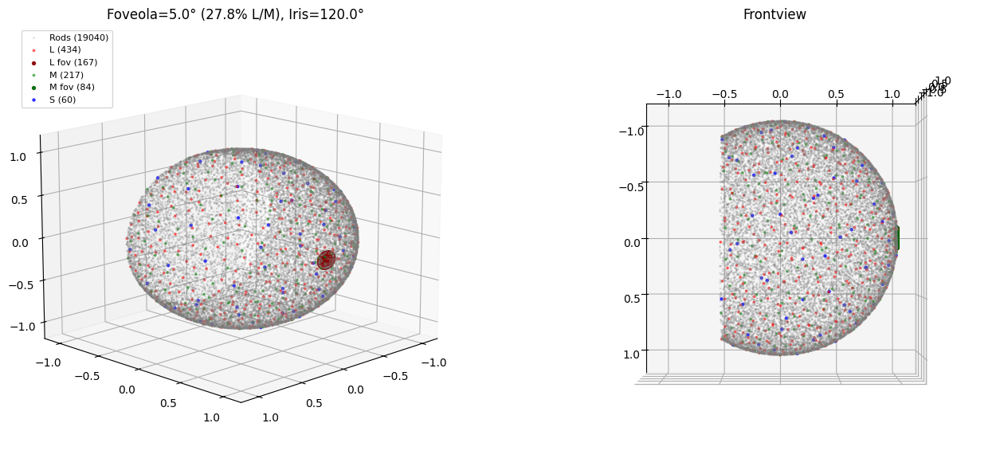

In [15]:
default={
    'layer_count': 20000,
    
    'rod_ratio': 0.952,
    'L_ratio': 0.030,
    'M_ratio': 0.015,
    'S_ratio': 0.003,
    
    'foveola_L_ratio_base': 0.004,
    'foveola_M_ratio_base': 0.004,
    'foveola_angle_base_deg': 0.6,
    'foveola_max_ratio': 0.5,
    
    'foveola_angle_deg': 5.0,
    'iris_angle_deg': 120.0,
    
    'radius': 1.0,
    'noise': 0.02,
}
photo1 = create_photoreceptor_layer(default,plot=True)


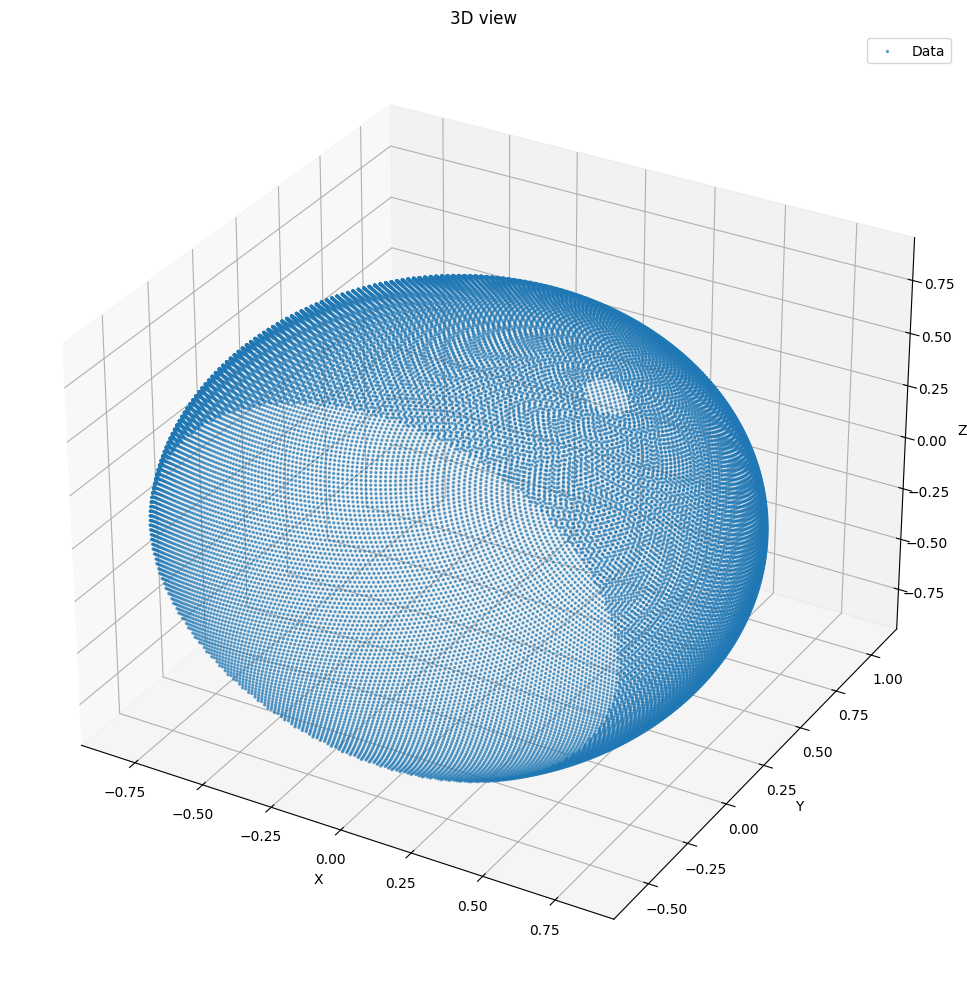

In [16]:
peripheral_retina_horizontal = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_retina_horizontal)

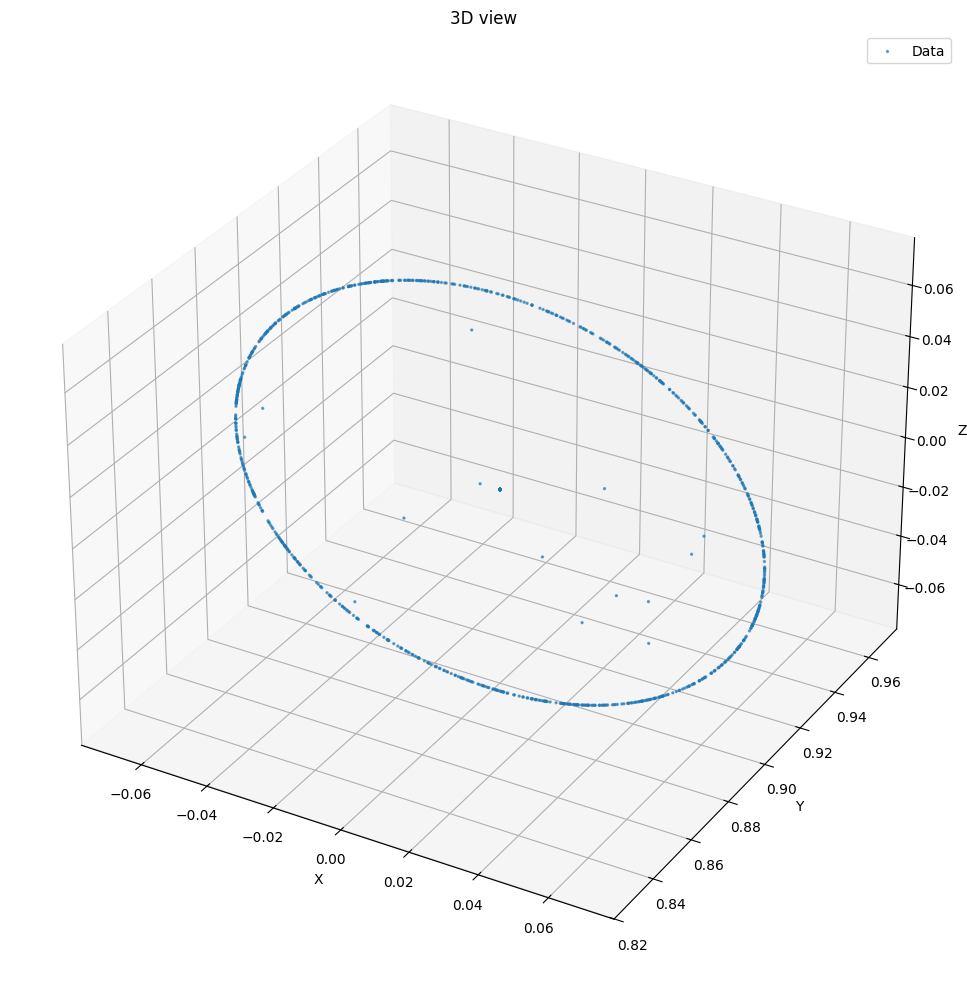

In [17]:
parafovea_horizontal = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea_horizontal)

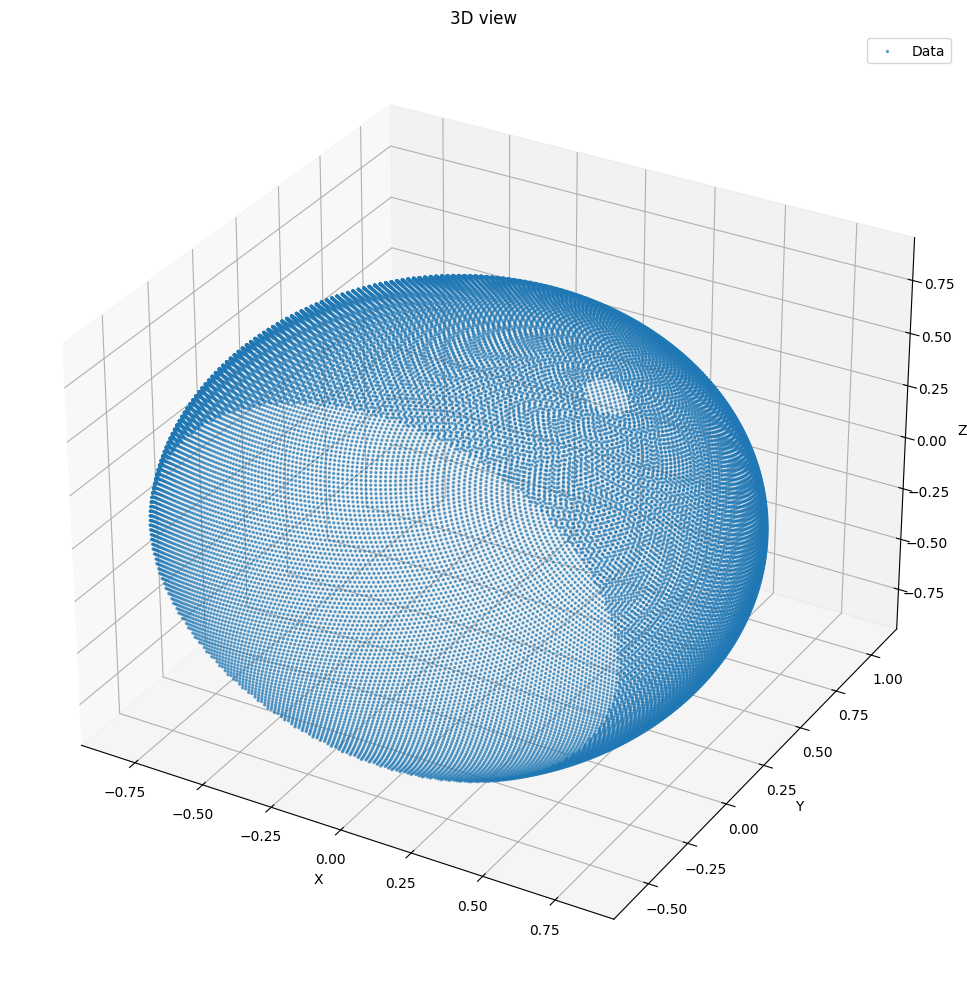

In [18]:
peripheral_retina_bipolar_OFF = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_retina_bipolar_OFF)

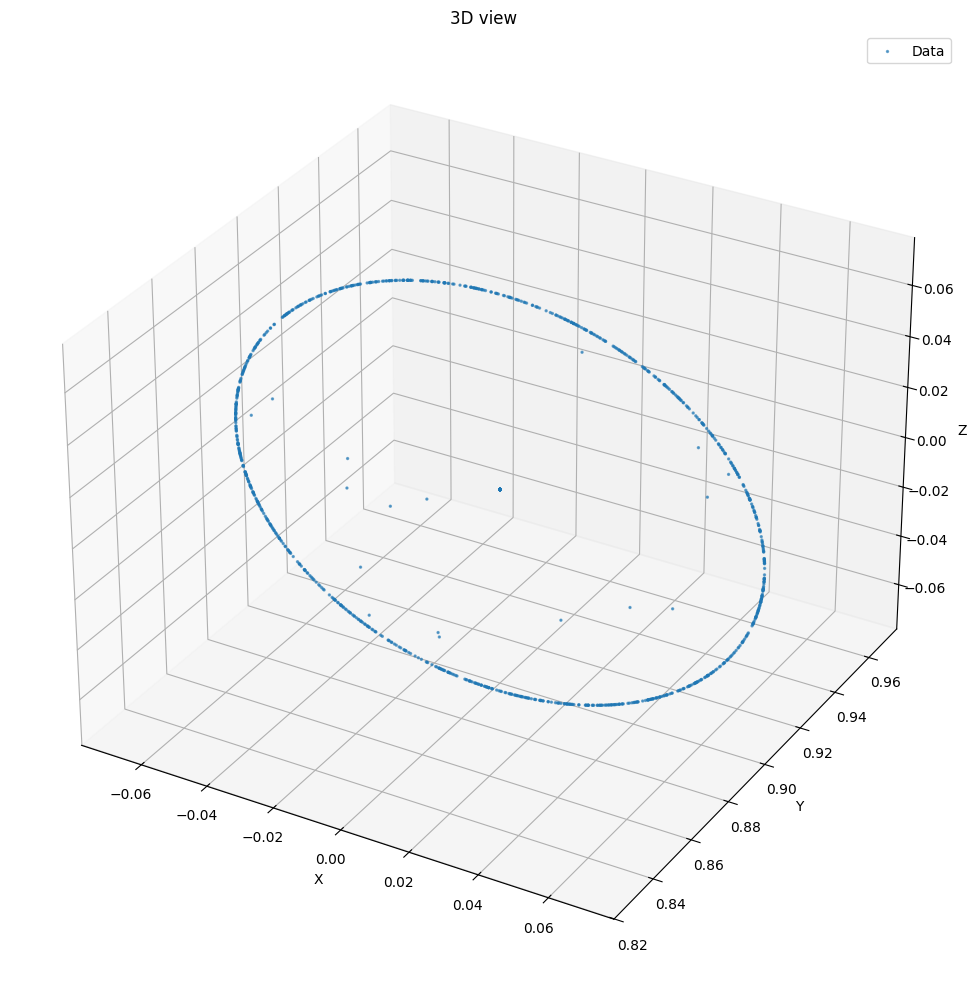

In [19]:
parafovea_bipolar_OFF = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea_bipolar_OFF)

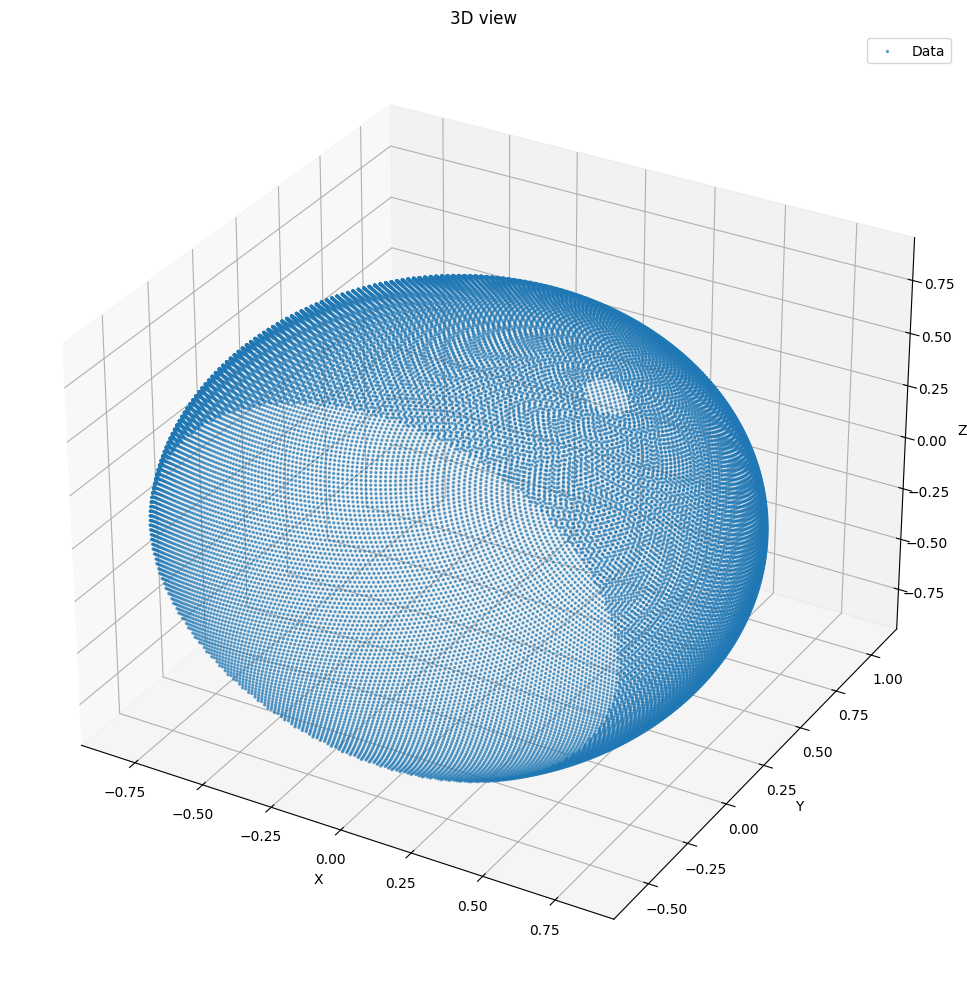

In [20]:
peripheral_retina_bipolar_ON = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_retina_bipolar_ON)

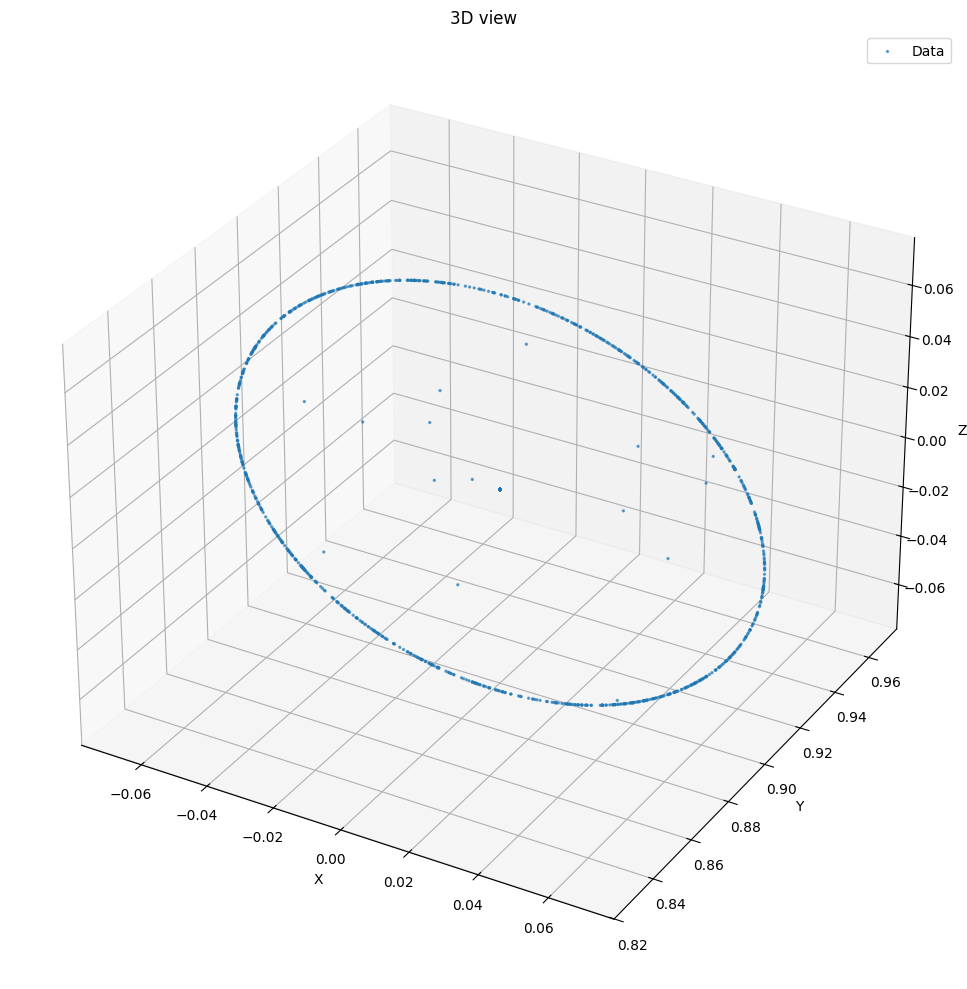

In [21]:
parafovea_bipolar_ON = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea_bipolar_ON)

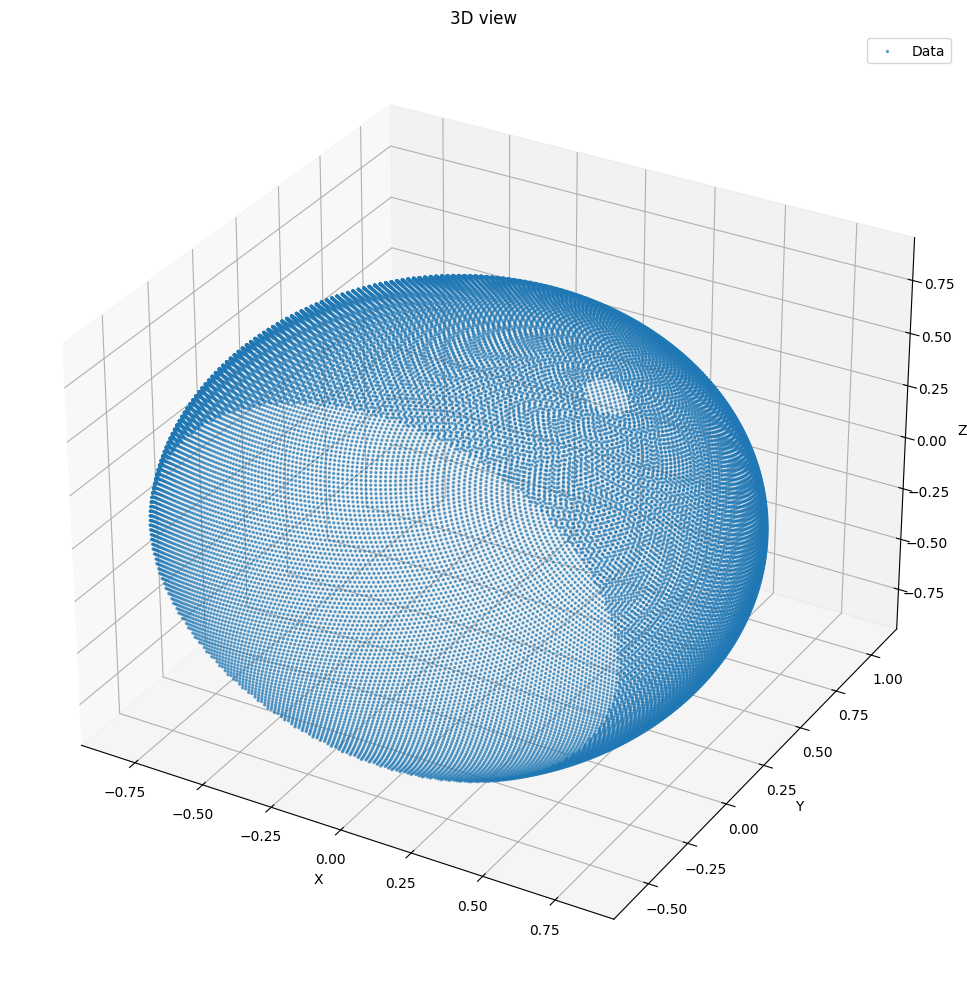

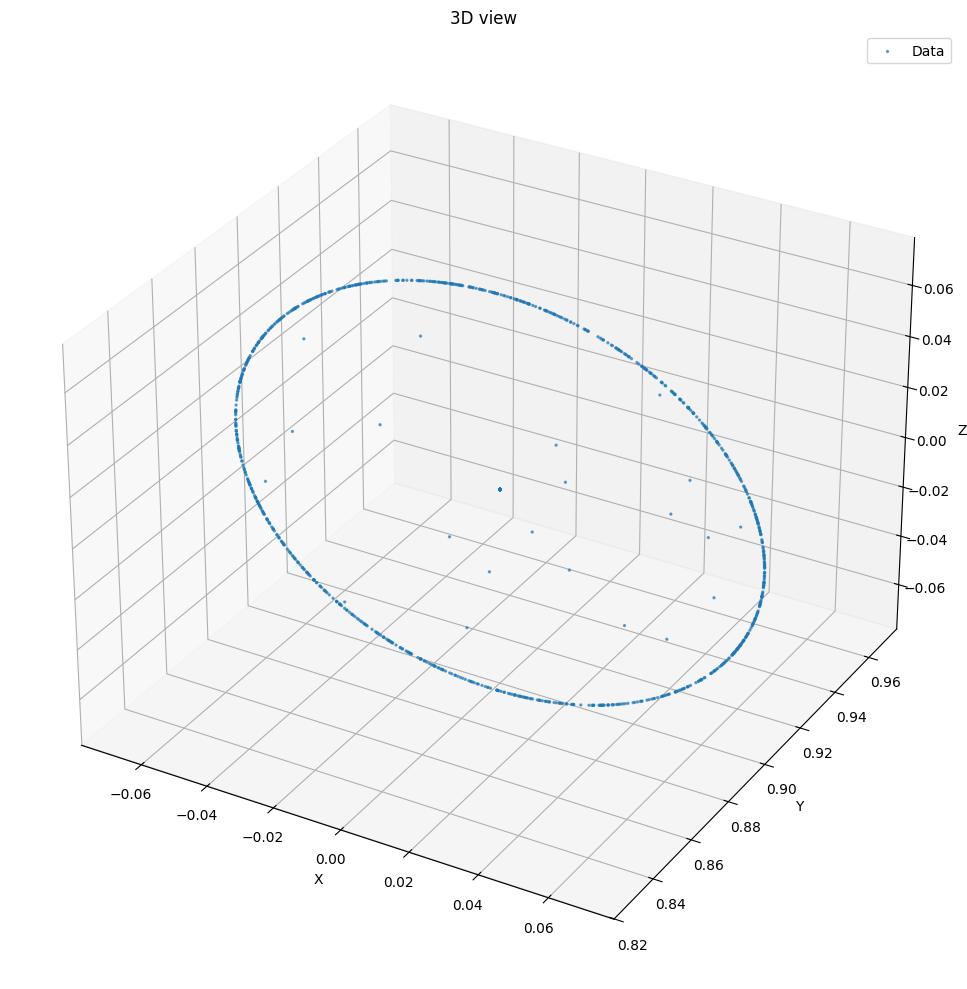

In [22]:
peripheral_amecrine = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_amecrine)
parafovea__amecrine  = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea__amecrine)

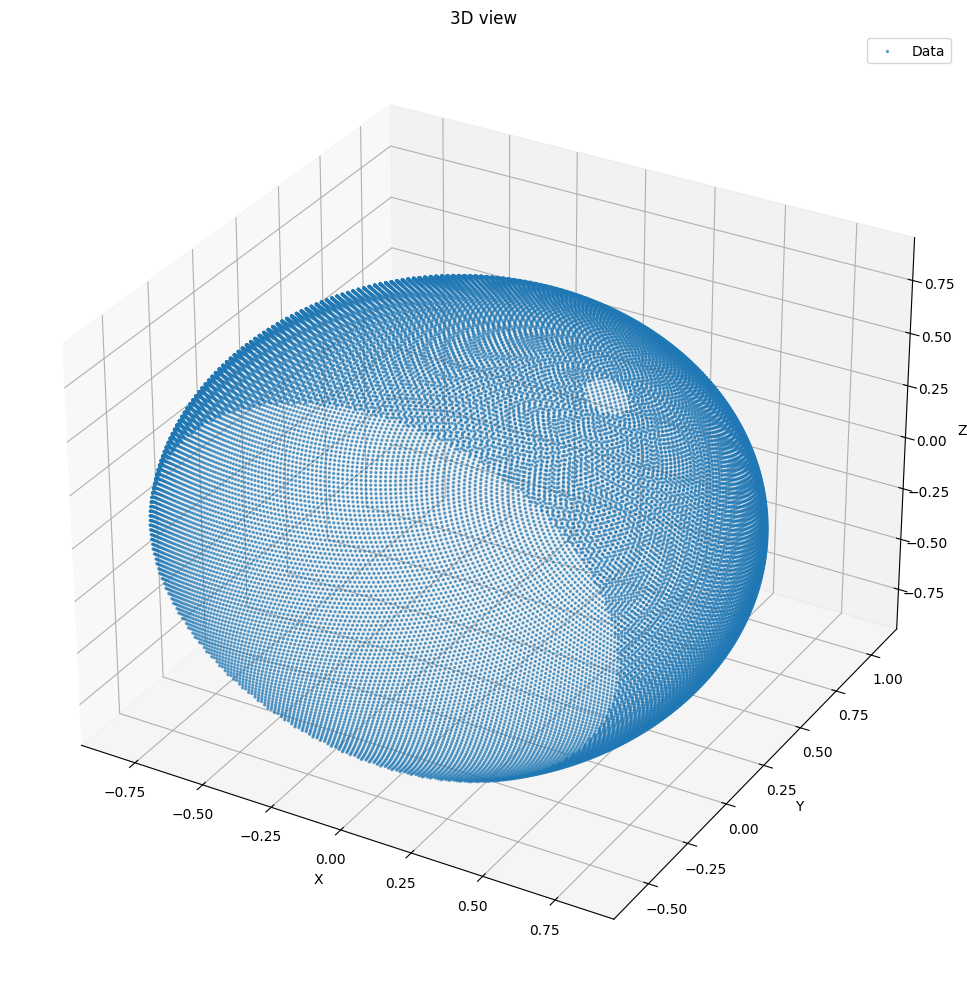

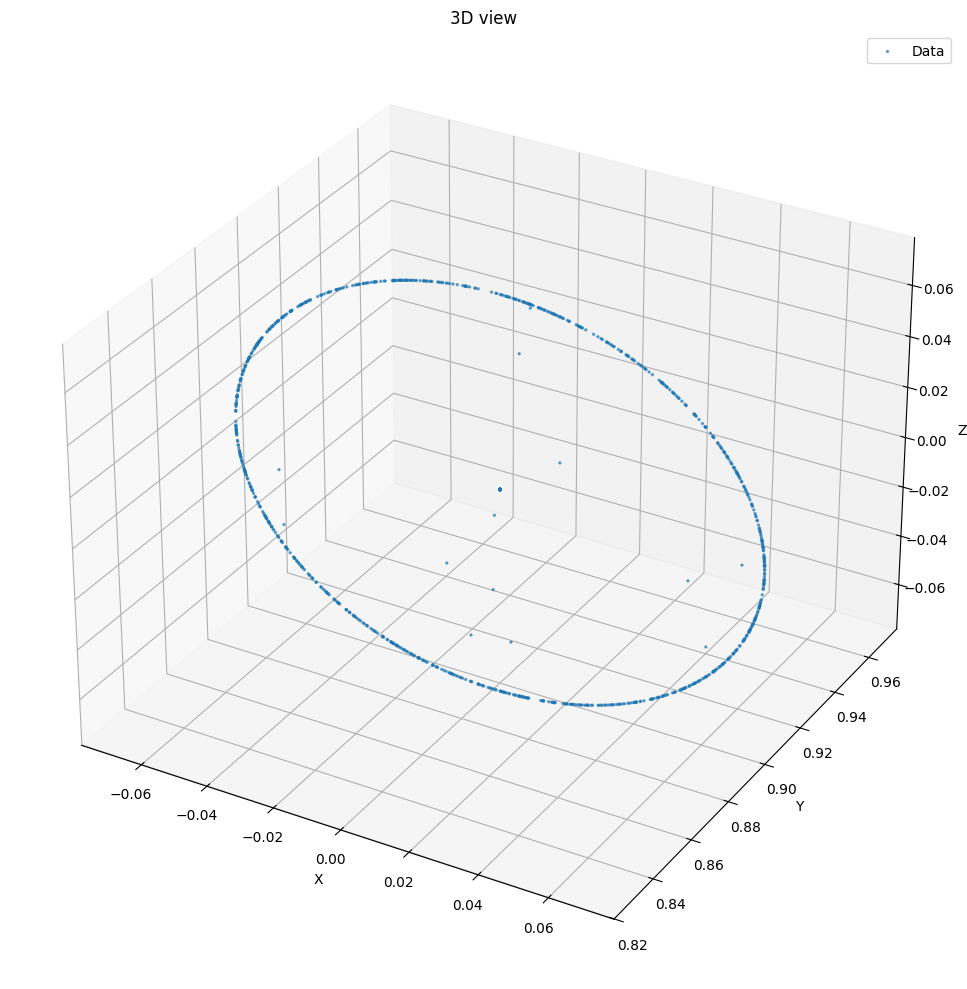

In [23]:
peripheral_ganglions= uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_ganglions)
parafovea__ganglions  = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea__ganglions)

In [24]:
def create_retinal_layers(params: dict = None, plot: bool = False) -> dict:

    defaults = {
        'radius_base': 1.0,
        'radius_step': 0.05,     
        'radius_max_delta': 0.2,  
        'foveola_angle_deg': 5.0,
        'iris_angle_deg': 120.0,
        'noise': 0.3,
        'foveal_radius_offset': 0.05, 
        
        'n_horizontal_peripheral': 300,
        'n_horizontal_foveal': 20,
        
        'n_bipolar_peripheral': 300,
        'n_bipolar_foveal': 20,
        
        'n_amacrine_peripheral': 300,
        'n_amacrine_foveal': 20,
        
        'n_ganglion_peripheral': 300,
        'n_ganglion_foveal': 20,
    }
    p = {**defaults, **(params or {})}
    
    layer_order = ['horizontal', 'bipolar_ON', 'bipolar_OFF', 'amacrine', 'ganglion']
    
    def calc_radius(layer_idx):
        delta = min(p['radius_base'] * p['radius_step'] * layer_idx, p['radius_max_delta'])
        return p['radius_base'] - delta
    
    def make_layer(n_periph, n_foveal, r_periph):
        r_foveal = r_periph - p['foveal_radius_offset']
        periph = uniform_sphere_band(
            n=n_periph, r=r_periph,
            angle_start_deg=p['foveola_angle_deg'],
            angle_end_deg=p['iris_angle_deg'],
            noise=p['noise']
        )
        foveal = uniform_cap_points(
            n=n_foveal, r=r_foveal,
            angle_deg=p['foveola_angle_deg'],
            noise=p['noise']
        )
        return {
            'peripheral': periph, 
            'foveal': foveal, 
            'all': np.concatenate([periph, foveal]),
            'radius_peripheral': r_periph,
            'radius_foveal': r_foveal,
        }
    
    layer_params = {
        'horizontal': (p['n_horizontal_peripheral'], p['n_horizontal_foveal']),
        'bipolar_ON': (p['n_bipolar_peripheral'], p['n_bipolar_foveal']),
        'bipolar_OFF': (p['n_bipolar_peripheral'], p['n_bipolar_foveal']),
        'amacrine': (p['n_amacrine_peripheral'], p['n_amacrine_foveal']),
        'ganglion': (p['n_ganglion_peripheral'], p['n_ganglion_foveal']),
    }
    
    layers = {}
    for idx, name in enumerate(layer_order):
        n_periph, n_foveal = layer_params[name]
        r = calc_radius(idx)
        layers[name] = make_layer(n_periph, n_foveal, r)
    
    counts = {}
    for name, layer in layers.items():
        counts[f'{name}_peripheral'] = len(layer['peripheral'])
        counts[f'{name}_foveal'] = len(layer['foveal'])
        counts[f'{name}_total'] = len(layer['all'])
        counts[f'{name}_radius'] = layer['radius_peripheral']
    counts['total'] = sum(len(l['all']) for l in layers.values())
    
    result = {
        **layers,
        'counts': counts,
        'params': p,
        'layer_order': layer_order,
    }
    
    if plot:
        _plot_retinal_layers(layers, p, layer_order)
    
    return result


def _plot_retinal_layers(layers: dict, p: dict, layer_order: list):
    colors = {
        'horizontal': ('orange', 'darkorange'),
        'bipolar_ON': ('lime', 'darkgreen'),
        'bipolar_OFF': ('cyan', 'darkcyan'),
        'amacrine': ('magenta', 'darkmagenta'),
        'ganglion': ('yellow', 'gold'),
    }
    
    fig = plt.figure(figsize=(16, 6))
    r = p['radius_base']
    
    def scatter_all(ax):
        for name in layer_order:
            layer = layers[name]
            c_periph, c_foveal = colors[name]
            r_p = layer['radius_peripheral']
            ax.scatter(*layer['peripheral'].T, s=1, c=c_periph, alpha=0.3,
                      label=f"{name} (r={r_p:.2f})")
            ax.scatter(*layer['foveal'].T, s=4, c=c_foveal, alpha=0.7)
        ax.set_xlim(-r*1.2, r*1.2)
        ax.set_ylim(-r*1.2, r*1.2)
        ax.set_zlim(-r*1.2, r*1.2)
    
    ax1 = fig.add_subplot(121, projection='3d')
    scatter_all(ax1)
    ax1.legend(loc='upper left', fontsize=7)
    ax1.set_title(f'Retinal Layers (1% radius decrease per layer)')
    ax1.view_init(elev=15, azim=45)
    
    ax2 = fig.add_subplot(122, projection='3d')
    scatter_all(ax2)
    ax2.set_title('Frontview')
    ax2.view_init(elev=90, azim=0)
    
    plt.tight_layout()
    plt.show()

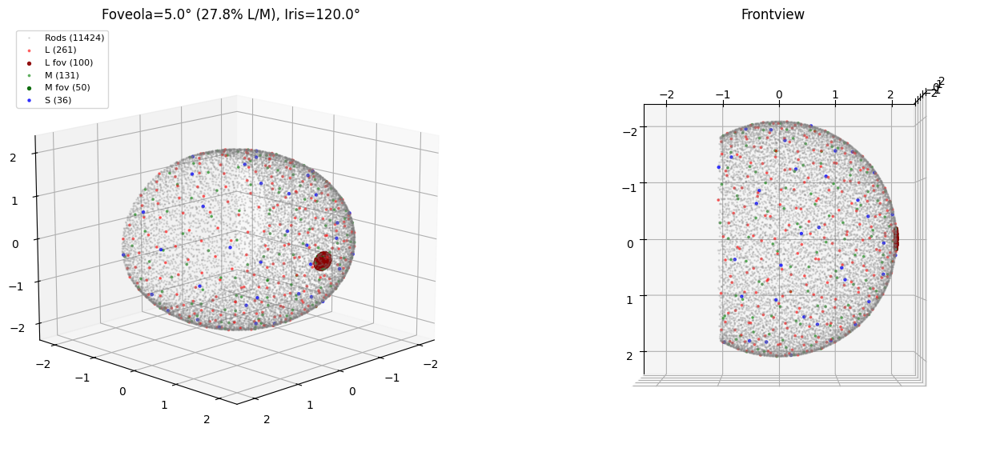

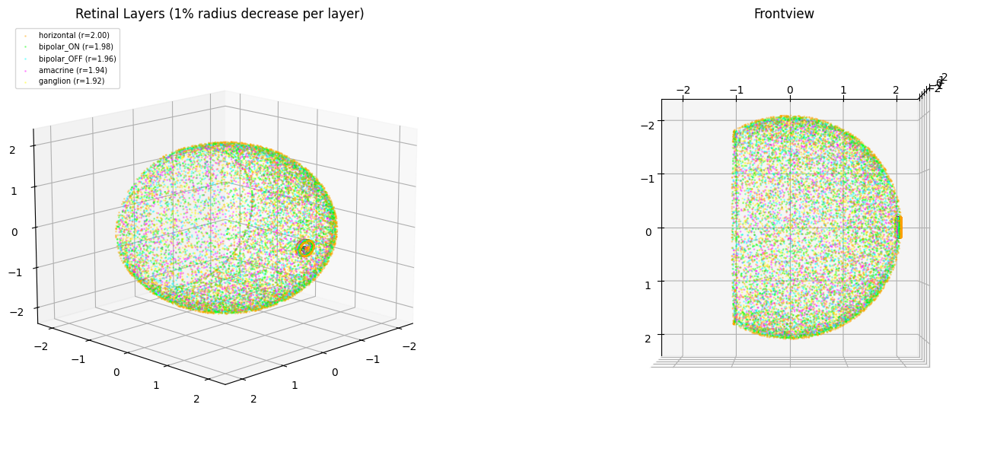

{'horizontal_peripheral': 3000, 'horizontal_foveal': 200, 'horizontal_total': 3200, 'horizontal_radius': 2.0, 'bipolar_ON_peripheral': 3000, 'bipolar_ON_foveal': 200, 'bipolar_ON_total': 3200, 'bipolar_ON_radius': 1.98, 'bipolar_OFF_peripheral': 3000, 'bipolar_OFF_foveal': 200, 'bipolar_OFF_total': 3200, 'bipolar_OFF_radius': 1.96, 'amacrine_peripheral': 3000, 'amacrine_foveal': 200, 'amacrine_total': 3200, 'amacrine_radius': 1.94, 'ganglion_peripheral': 3000, 'ganglion_foveal': 200, 'ganglion_total': 3200, 'ganglion_radius': 1.92, 'total': 16000}


In [25]:
default_rods={
    'layer_count': 12000,
    
    'rod_ratio': 0.952,
    'L_ratio': 0.030,
    'M_ratio': 0.015,
    'S_ratio': 0.003,
    
    'foveola_L_ratio_base': 0.004,
    'foveola_M_ratio_base': 0.004,
    'foveola_angle_base_deg': 0.6,
    'foveola_max_ratio': 0.5,
    
    'foveola_angle_deg': 5.0,
    'iris_angle_deg': 120.0,
    
    'radius': 2.0,
    'noise': 0.01,
}
defaults_layers = {
        'radius_base': 2.0,
        'radius_step': 0.01,     
        'radius_max_delta': 0.2,  
        'foveola_angle_deg': 5.0,
        'iris_angle_deg': 120.0,
        'noise': 0.2,
        'foveal_radius_offset': 0.01, 
        
        'n_horizontal_peripheral': 3000,
        'n_horizontal_foveal': 200,
        
        'n_bipolar_peripheral': 3000,
        'n_bipolar_foveal': 200,
        
        'n_amacrine_peripheral': 3000,
        'n_amacrine_foveal': 200,
        
        'n_ganglion_peripheral': 3000,
        'n_ganglion_foveal': 200,
    }
rods_n_cones = create_photoreceptor_layer(default_rods,plot=True)
retina = create_retinal_layers(params=defaults_layers,plot=True)

horizontal_all = retina['horizontal']['all']
ganglion_foveal = retina['ganglion']['foveal']
bipolar_on_periph = retina['bipolar_ON']['peripheral']

print(retina['counts'])

In [26]:
retina.keys()

dict_keys(['horizontal', 'bipolar_ON', 'bipolar_OFF', 'amacrine', 'ganglion', 'counts', 'params', 'layer_order'])

In [27]:
rods_n_cones.keys()

dict_keys(['L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral', 'rods', 'counts', 'params'])

In [28]:
#photoreceptors -exhib

#iaf_psc_alpha

In [29]:
#horizontal inhib, w=-10

#iaf_psc_alpha

In [30]:
# bipolar ON W<0 , OFF INVERT

#iaf_psc_alpha 

In [31]:
# Amacrine inhib, müssen kürzere tau_m als die ganglien haben

#iaf_psc_alpha/aeif_cond_alpha

In [32]:
# ganglien - midget kleineres cm, höhere reizschwelle - parasol -größeres soma daher größeres cm, feuern schneller

#iaf_psc_alpha/aeif_cond_alpha

In [33]:
layer_params = {

    'photoreceptors': {
        "tau_m": 20.0,       
        "C_m": 250.0,        
        "V_th": -55.0,       
        "V_reset": -70.0,    
        "t_ref": 2.0,        
        "I_e": 0.0          
    },

    'horizontal': {
        "tau_m": 30.0,       
        "C_m": 250.0,
        "V_th": -57.0,       
        "V_reset": -70.0,
        "t_ref": 2.0,
        "tau_syn_ex": 2.0,
        "tau_syn_in": 5.0
    },


    'bipolar': {
        "tau_m": 10.0,       
        "C_m": 250.0,
        "V_th": -55.0,
        "V_reset": -70.0,
        "t_ref": 2.0,
        "tau_syn_ex": 1.0,   
        "tau_syn_in": 3.0
    },


    'amacrine': {
        "C_m": 200.0,        
        "g_L": 10.0,         
        "E_L": -70.0,        
        "V_th": -55.0,
        "V_reset": -60.0,
        "t_ref": 2.0,
        "a": 2.0,            
        "b": 40.0,           
        "w": 0.0,            
        "tau_w": 100.0,      
        "V_peak": 0.0        
    },

    'ganglion': {
        "C_m": 250.0,
        "g_L": 12.0,
        "E_L": -70.0,
        "V_th": -52.0,       
        "V_reset": -60.0,
        "t_ref": 2.0,
        "a": 4.0,            
        "b": 80.5,           
        "tau_w": 150.0,      
        "V_peak": 0.0
    }
}


synapse_params = {

    'syn_receptor_to_bipolar_ON': {
        "weight": 20.0,   
        "delay": 1.0,
        "model": "static_synapse"
    },
    'syn_receptor_to_bipolar_OFF': {
        "weight": -20.0,   
        "delay": 1.0,
        "model": "static_synapse"
    }
}

In [34]:
import nest
import numpy as np

nest.ResetKernel()
nest.resolution = 0.1

populations = {}

photo_params = layer_params['photoreceptors']
for name in ['L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']:
    pos = rods_n_cones[name]
    if len(pos) > 0:
        populations[name] = nest.Create(
            'iaf_psc_alpha',
            positions=nest.spatial.free(pos.tolist(), edge_wrap=False),
            params=photo_params
        )

n_foveal_cones = len(rods_n_cones['L_foveola']) + len(rods_n_cones['M_foveola'])

n_bipolar_foveal_per_type = n_foveal_cones  
n_ganglion_foveal_per_type = n_foveal_cones  

print(f"Foveale Cones: {n_foveal_cones} (L: {len(rods_n_cones['L_foveola'])}, M: {len(rods_n_cones['M_foveola'])})")
print(f"Bipolar ON foveal: {n_bipolar_foveal_per_type}")
print(f"Bipolar OFF foveal: {n_bipolar_foveal_per_type}")
print(f"Ganglion ON foveal: {n_ganglion_foveal_per_type}")
print(f"Ganglion OFF foveal: {n_ganglion_foveal_per_type}")

horiz_params = {k: v for k, v in layer_params['horizontal'].items() 
                if k not in ['tau_syn_ex', 'tau_syn_in']}
for region in ['foveal', 'peripheral']:
    pop_key = f'horizontal_{region}'
    positions = retina['horizontal'][region]
    if len(positions) > 0:
        populations[pop_key] = nest.Create(
            'iaf_psc_alpha',
            positions=nest.spatial.free(positions.tolist(), edge_wrap=False),
            params=horiz_params
        )

bipolar_params = {k: v for k, v in layer_params['bipolar'].items() 
                  if k not in ['tau_syn_ex', 'tau_syn_in']}

foveal_bipolar_positions = retina['bipolar_ON']['foveal'][:n_bipolar_foveal_per_type]

for pol in ['ON', 'OFF']:
    pop_key = f'bipolar_{pol}_foveal'
    populations[pop_key] = nest.Create(
        'iaf_psc_alpha',
        positions=nest.spatial.free(foveal_bipolar_positions.tolist(), edge_wrap=False),
        params=bipolar_params
    )
    
    pop_key = f'bipolar_{pol}_peripheral'
    positions = retina[f'bipolar_{pol}']['peripheral']
    if len(positions) > 0:
        populations[pop_key] = nest.Create(
            'iaf_psc_alpha',
            positions=nest.spatial.free(positions.tolist(), edge_wrap=False),
            params=bipolar_params
        )

amacrine_params = {k: v for k, v in layer_params['amacrine'].items() if k != 'w'}
for region in ['foveal', 'peripheral']:
    pop_key = f'amacrine_{region}'
    positions = retina['amacrine'][region]
    if len(positions) > 0:
        populations[pop_key] = nest.Create(
            'aeif_cond_alpha',
            positions=nest.spatial.free(positions.tolist(), edge_wrap=False),
            params=amacrine_params
        )

ganglion_params = layer_params['ganglion']

foveal_ganglion_positions = retina['ganglion']['foveal'][:n_ganglion_foveal_per_type]

for pol in ['ON', 'OFF']:
    pop_key = f'ganglion_{pol}_foveal'
    populations[pop_key] = nest.Create(
        'aeif_cond_alpha',
        positions=nest.spatial.free(foveal_ganglion_positions.tolist(), edge_wrap=False),
        params=ganglion_params
    )

pop_key = 'ganglion_peripheral'
positions = retina['ganglion']['peripheral']
if len(positions) > 0:
    populations[pop_key] = nest.Create(
        'aeif_cond_alpha',
        positions=nest.spatial.free(positions.tolist(), edge_wrap=False),
        params=ganglion_params
    )

print("\nPopulations:")
for name in sorted(populations.keys()):
    print(f"  {name:<25}: {len(populations[name])} Neurons")

print(f"Foveal Midget Pathway (1:1:1)")
print(f"Cones (L+M):           {n_foveal_cones}")
print(f"Bipolar ON:            {len(populations['bipolar_ON_foveal'])}")
print(f"Bipolar OFF:           {len(populations['bipolar_OFF_foveal'])}")
print(f"Ganglion ON:           {len(populations['ganglion_ON_foveal'])}")
print(f"Ganglion OFF:          {len(populations['ganglion_OFF_foveal'])}")
print(f"\ncorrect: Cone == Bipolar_ON == Ganglion_ON: {n_foveal_cones == len(populations['bipolar_ON_foveal']) == len(populations['ganglion_ON_foveal'])}")
print(f"correct: Cone == Bipolar_OFF == Ganglion_OFF: {n_foveal_cones == len(populations['bipolar_OFF_foveal']) == len(populations['ganglion_OFF_foveal'])}")



              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: 3.9.0-post0.dev0
 Built: Nov  5 2025 22:40:13

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.


Dec 16 21:31:13 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.
Foveale Cones: 150 (L: 100, M: 50)
Bipolar ON foveal: 150
Bipolar OFF foveal: 150
Ganglion ON foveal: 150
Ganglion OFF foveal: 150

Populations:
  L_foveola                : 100 Neurons
  L_peripheral             : 261 Neurons
  M_foveola                : 50 Neurons
  M_peripheral             : 131 Neurons
  S_peripheral             : 36 Neurons
  amacrine_foveal          : 200 Neurons
  amacrine_peripheral      : 3000 Neurons
  bipolar_OFF_foveal       : 150 Neurons
  bipolar_OFF_peripheral   : 3000 Neurons
  bipolar_ON_foveal        : 150 Neur

In [35]:
nest.SetStatus(populations['bipolar_OFF_foveal'], {'I_e': 90.0})
nest.SetStatus(populations['bipolar_OFF_peripheral'], {'I_e': 90.0})

center_mask_peripheral = nest.CreateMask('spherical', {'radius': 0.2})
conn_center_peripheral = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.8,
    'mask': center_mask_peripheral
}
syn_center_peripheral = {'weight': 15.0, 'delay': 1.0}

surround_mask_peripheral = (
    nest.CreateMask('spherical', {'radius': 0.5}) - 
    nest.CreateMask('spherical', {'radius': 0.12})
)
conn_surround_peripheral = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.25) * 0.4,
    'mask': surround_mask_peripheral
}
syn_surround_peripheral = {'weight': -8.0, 'delay': 1.5}

#FOVEOLA
center_mask_foveal = nest.CreateMask('spherical', {'radius': 0.1})
conn_center_foveal = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.05) * 0.9,
    'mask': center_mask_foveal
}
syn_center_foveal = {'weight': 18.0, 'delay': 1.0}

surround_mask_foveal = (
    nest.CreateMask('spherical', {'radius': 0.25}) - 
    nest.CreateMask('spherical', {'radius': 0.08})
)
conn_surround_foveal = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.12) * 0.25,
    'mask': surround_mask_foveal
}
syn_surround_foveal = {'weight': -5.0, 'delay': 1.5}

#HORIZONTAL
peripheral = ['L_peripheral', 'M_peripheral', 'S_peripheral', 'rods']
foveola = ['L_foveola', 'M_foveola']

for src in peripheral:
    nest.Connect(populations[src], populations['horizontal_peripheral'],
                 conn_spec=conn_center_peripheral, syn_spec=syn_center_peripheral)
    nest.Connect(populations['horizontal_peripheral'], populations[src],
                 conn_spec=conn_surround_peripheral, syn_spec=syn_surround_peripheral)

for src in foveola:
    nest.Connect(populations[src], populations['horizontal_foveal'],
                 conn_spec=conn_center_foveal, syn_spec=syn_center_foveal)
    nest.Connect(populations['horizontal_foveal'], populations[src],
                 conn_spec=conn_surround_foveal, syn_spec=syn_surround_foveal)


syn_cone_to_bipolar_ON = {'weight': 20.0, 'delay': 1.0}
syn_cone_to_bipolar_OFF = {'weight': -20.0, 'delay': 1.0}


all_cone_ids = populations['L_foveola'].tolist() + populations['M_foveola'].tolist()
src_nc = nest.NodeCollection(all_cone_ids)
tgt_on_nc = nest.NodeCollection(populations['bipolar_ON_foveal'].tolist())
tgt_off_nc = nest.NodeCollection(populations['bipolar_OFF_foveal'].tolist())

nest.Connect(src_nc, tgt_on_nc, conn_spec='one_to_one', syn_spec=syn_cone_to_bipolar_ON)
nest.Connect(src_nc, tgt_off_nc, conn_spec='one_to_one', syn_spec=syn_cone_to_bipolar_OFF)

print(f"Foveal 1:1: {len(all_cone_ids)} Cones → {len(tgt_on_nc)} Bipolars pro Pathway")

conn_diffuse = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15) * 0.6,
    'mask': nest.CreateMask('spherical', {'radius': 0.3})
}

for src in ['L_peripheral', 'M_peripheral', 'S_peripheral']:
    nest.Connect(populations[src], populations['bipolar_ON_peripheral'],
                 conn_spec=conn_diffuse, syn_spec=syn_cone_to_bipolar_ON)
    nest.Connect(populations[src], populations['bipolar_OFF_peripheral'],
                 conn_spec=conn_diffuse, syn_spec=syn_cone_to_bipolar_OFF)

nest.Connect(populations['rods'], populations['bipolar_ON_peripheral'],
             conn_spec=conn_diffuse, syn_spec={'weight': 10.0, 'delay': 1.5})

Foveal 1:1: 150 Cones → 150 Bipolars pro Pathway


In [36]:
# we only know what the retinal ganglion cells are doing
#Midget ON   (klein, sustained, Color)
#Midget OFF  (klein, sustained, Color)
#Parasol ON  (groß, transient, Motion)
#Parasol OFF (groß, transient, Motion)

In [37]:

nest.Connect(
    populations['bipolar_ON_foveal'],
    populations['ganglion_ON_foveal'],
    conn_spec={'rule': 'one_to_one'},
    syn_spec={'weight': 30.0, 'delay': 1.0}
)
nest.Connect(
    populations['bipolar_OFF_foveal'],
    populations['ganglion_OFF_foveal'],
    conn_spec={'rule': 'one_to_one'},
    syn_spec={'weight': 30.0, 'delay': 1.0}
)


In [38]:
mask_center = nest.CreateMask('spherical', {'radius': 0.15})

conn_on_center = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.08),
    'mask': mask_center
}

syn_on_center = {
    'weight': 35.0,  # Stark exzitatorisch
    'delay': 1.0
}

nest.Connect(
    populations['bipolar_ON_peripheral'], 
    populations['ganglion_peripheral'],
    conn_spec=conn_on_center, 
    syn_spec=syn_on_center
)

mask_surround = nest.CreateMask('spherical', {'radius': 0.45})

conn_off_surround = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.25), # Breiter Streuung
    'mask': mask_surround
}

syn_off_surround = {
    'weight': -15.0, 
    'delay': 1.5 
}

nest.Connect(
    populations['bipolar_OFF_peripheral'], 
    populations['ganglion_peripheral'],
    conn_spec=conn_off_surround, 
    syn_spec=syn_off_surround
)



In [39]:
# 1. Bipolar -> Amacrine 
conn_bipolar_amacrine = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.15),
    'mask': nest.CreateMask('spherical', {'radius': 0.3})
}

nest.Connect(populations['bipolar_ON_peripheral'], populations['amacrine_peripheral'],
             conn_spec=conn_bipolar_amacrine, syn_spec={'weight': 20.0, 'delay': 1.0})
nest.Connect(populations['bipolar_OFF_peripheral'], populations['amacrine_peripheral'],
             conn_spec=conn_bipolar_amacrine, syn_spec={'weight': 20.0, 'delay': 1.0})

# 2. Amacrine -> Ganglion 
conn_amacrine_ganglion = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.1) * 0.3,  # Reduziert
    'mask': nest.CreateMask('spherical', {'radius': 0.2})  # Kleiner
}
nest.Connect(populations['amacrine_peripheral'], populations['ganglion_peripheral'],
             conn_spec=conn_amacrine_ganglion, syn_spec={'weight': -12.0, 'delay': 1.5})

# 3. Amacrine -> Bipolar 
nest.Connect(populations['amacrine_peripheral'], populations['bipolar_ON_peripheral'],
             conn_spec=conn_amacrine_ganglion, syn_spec={'weight': -8.0, 'delay': 2.0})
nest.Connect(populations['amacrine_peripheral'], populations['bipolar_OFF_peripheral'],
             conn_spec=conn_amacrine_ganglion, syn_spec={'weight': -8.0, 'delay': 2.0})

# 4. Foveal Amacrine 
conn_amacrine_foveal = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.08),
    'mask': nest.CreateMask('spherical', {'radius': 0.15})
}

nest.Connect(populations['bipolar_ON_foveal'], populations['amacrine_foveal'],
             conn_spec=conn_amacrine_foveal, syn_spec={'weight': 15.0, 'delay': 1.0})
nest.Connect(populations['bipolar_OFF_foveal'], populations['amacrine_foveal'],
             conn_spec=conn_amacrine_foveal, syn_spec={'weight': 15.0, 'delay': 1.0})

nest.Connect(populations['amacrine_foveal'], populations['ganglion_ON_foveal'],
             conn_spec=conn_amacrine_foveal, syn_spec={'weight': -10.0, 'delay': 1.5})
nest.Connect(populations['amacrine_foveal'], populations['ganglion_OFF_foveal'],
             conn_spec=conn_amacrine_foveal, syn_spec={'weight': -10.0, 'delay': 1.5})

In [40]:

cone_pos = np.array(nest.GetPosition(populations['L_foveola']))
bipolar_pos = np.array(nest.GetPosition(populations['bipolar_ON_foveal']))

print(f"Cone positions (min/max r): {np.linalg.norm(cone_pos, axis=1).min():.2f} / {np.linalg.norm(cone_pos, axis=1).max():.2f}")
print(f"Bipolar positions (min/max r): {np.linalg.norm(bipolar_pos, axis=1).min():.2f} / {np.linalg.norm(bipolar_pos, axis=1).max():.2f}")

from scipy.spatial import cKDTree
tree = cKDTree(bipolar_pos)
dists, _ = tree.query(cone_pos, k=1)
print(f"Min distance Cone->Bipolar: {dists.min():.3f}, Max: {dists.max():.3f}")
print(f"Maske radius war: 0.05 - {'ZU KLEIN!' if dists.min() > 0.05 else 'OK'}")

Cone positions (min/max r): 2.00 / 2.00
Bipolar positions (min/max r): 1.97 / 1.97
Min distance Cone->Bipolar: 0.030, Max: 0.086
Maske radius war: 0.05 - OK


---

In [41]:
print("RETINA SANITY CHECK")


cone_pos = np.array(nest.GetPosition(populations['L_foveola']))
bipolar_pos = np.array(nest.GetPosition(populations['bipolar_ON_foveal']))
print(f"\n[GEOMETRY]")
print(f"  Cone radius:    {np.linalg.norm(cone_pos, axis=1).mean():.2f}")
print(f"  Bipolar radius: {np.linalg.norm(bipolar_pos, axis=1).mean():.2f}")
print(f"  Layer-Distance:  {np.linalg.norm(cone_pos, axis=1).mean() - np.linalg.norm(bipolar_pos, axis=1).mean():.3f} ✓")

print(f"\n[VERBINDUNGEN]")
checks = [
    ('L_foveola', 'bipolar_ON_foveal', '>0'),
    ('L_foveola', 'bipolar_OFF_foveal', '>0'),
    ('bipolar_ON_foveal', 'ganglion_ON_foveal', '==150'),
    ('bipolar_OFF_foveal', 'ganglion_OFF_foveal', '==150'),
    ('bipolar_ON_peripheral', 'ganglion_peripheral', '>0'),
    ('amacrine_peripheral', 'ganglion_peripheral', '>0'),
    ('amacrine_peripheral', 'bipolar_ON_peripheral', '>0'),
]

all_ok = True
for src, tgt, expected in checks:
    conns = nest.GetConnections(populations[src], populations[tgt])
    n = len(conns)
    
    if expected == '>0':
        ok = n > 0
    elif expected.startswith('=='):
        ok = n == int(expected[2:])
    else:
        ok = True
    
    status = "✓" if ok else "✗"
    all_ok &= ok
    ratio = n / len(populations[src]) if len(populations[src]) > 0 else 0
    print(f"  {src:25} → {tgt:25}: {n:6} ({ratio:.1f}/src) {status}")

print(f"\n[FOVEAL 1:1:1 PATHWAY]")
n_cones = len(populations['L_foveola']) + len(populations['M_foveola'])
n_bip_on = len(populations['bipolar_ON_foveal'])
n_gang_on = len(populations['ganglion_ON_foveal'])
chain_ok = (n_cones == n_bip_on == n_gang_on)
print(f"  Cones={n_cones}, Bipolar_ON={n_bip_on}, Ganglion_ON={n_gang_on} → {'✓' if chain_ok else '✗'}")

# 4. Gesamtzahlen
print(f"\n[NETWORK SUMMARY]")
total_neurons = sum(len(p) for p in populations.values())
total_conns = len(nest.GetConnections())
print(f"  Neurons:     {total_neurons:,}")
print(f"  Connections: {total_conns:,}")
print(f"  Ratio:        {total_conns/total_neurons:.1f} conns/neuron")

print("\n" + "=" * 60)
print(f"STATUS: {'ALL OK ✓' if all_ok else 'ISSUES FOUND ✗'}")
print("=" * 60)

RETINA SANITY CHECK

[GEOMETRY]
  Cone radius:    2.00
  Bipolar radius: 1.97
  Layer-Distance:  0.030 ✓

[VERBINDUNGEN]
  L_foveola                 → bipolar_ON_foveal        :    100 (1.0/src) ✓
  L_foveola                 → bipolar_OFF_foveal       :    100 (1.0/src) ✓
  bipolar_ON_foveal         → ganglion_ON_foveal       :    150 (1.0/src) ✓
  bipolar_OFF_foveal        → ganglion_OFF_foveal      :    150 (1.0/src) ✓
  bipolar_ON_peripheral     → ganglion_peripheral      :   6977 (2.3/src) ✓
  amacrine_peripheral       → ganglion_peripheral      :   4533 (1.5/src) ✓
  amacrine_peripheral       → bipolar_ON_peripheral    :   4262 (1.4/src) ✓

[FOVEAL 1:1:1 PATHWAY]
  Cones=150, Bipolar_ON=150, Ganglion_ON=150 → ✓

[NETWORK SUMMARY]
  Neurons:     28,002
  Connections: 426,150
  Ratio:        15.2 conns/neuron

STATUS: ALL OK ✓


In [42]:
extra_checks = [
    ('L_foveola', 'horizontal_foveal', '>0'),
    ('horizontal_foveal', 'L_foveola', '>0'),
    ('rods', 'horizontal_peripheral', '>0'),
    
    ('L_peripheral', 'bipolar_ON_peripheral', '>0'),
    ('rods', 'bipolar_ON_peripheral', '>0'),
    
    ('M_foveola', 'bipolar_ON_foveal', '>0'),
]

print("\n[ADDITIONAL CHECKS]")
for src, tgt, _ in extra_checks:
    n = len(nest.GetConnections(populations[src], populations[tgt]))
    print(f"  {src:25} → {tgt:25}: {n:6}")


[ADDITIONAL CHECKS]
  L_foveola                 → horizontal_foveal        :   3869
  horizontal_foveal         → L_foveola                :   1270
  rods                      → horizontal_peripheral    :  38362
  L_peripheral              → bipolar_ON_peripheral    :   1445
  rods                      → bipolar_ON_peripheral    :  64316
  M_foveola                 → bipolar_ON_foveal        :     50


In [43]:
import numpy as np
import matplotlib.pyplot as plt
import nest

def map_neurons_to_pixel_grid(populations, grid_size=(64, 64), fov_radius=1.0):

    pixel_map = {}
    
    all_positions_list = []
    all_colors_list = [] 
    h, w = grid_size
    
    relevant_pops = ['rods', 'L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral']
    
    print(f"Map Neurons to {h}x{w} Grid...")
    
    for name in relevant_pops:
        if name not in populations or len(populations[name]) == 0:
            continue
            
        nodes = populations[name]
        ids = nodes.tolist() if hasattr(nodes, 'tolist') else list(nodes)
        pos = np.array(nest.GetPosition(nodes))
        

        X = pos[:, 0]
        Z = pos[:, 2]
        

        u = X / fov_radius 
        v = Z / fov_radius 
        
        u = (u + 1) / 2
        v = (v + 1) / 2
        
        col_indices = np.floor(u * w).astype(int)
        row_indices = np.floor(v * h).astype(int)
        
        col_indices = np.clip(col_indices, 0, w - 1)
        row_indices = np.clip(row_indices, 0, h - 1)
        
        for i, node_id in enumerate(ids):
            r, c = row_indices[i], col_indices[i]
            
            if (r, c) not in pixel_map:
                pixel_map[(r, c)] = []
            pixel_map[(r, c)].append(node_id)
            
            all_positions_list.append(pos[i])
            all_colors_list.append((r * w) + c)

    return pixel_map, np.array(all_positions_list), np.array(all_colors_list)

In [44]:
import numpy as np
import matplotlib.pyplot as plt

def map_neurons_to_grid_sections(
    neuron_positions: np.ndarray, 
    grid_resolution: int = 64, 
    fov_radius: float = 1.0, 
    cut: float = 0.4
) -> dict:

    N = len(neuron_positions)
    x = neuron_positions[:, 0]
    y = neuron_positions[:, 1]
    z = neuron_positions[:, 2]
    
    r_xz = np.sqrt(x**2 + z**2)
    
    theta = np.arccos(np.clip(y / fov_radius, -1.0, 1.0))
    
    phi = np.arctan2(z, x)
    
    y_cut_val = -(fov_radius - fov_radius * cut)
    theta_max = np.arccos(np.clip(y_cut_val / fov_radius, -1.0, 1.0))
    
    
    normalized_dist = theta / theta_max
    
    u = normalized_dist * np.cos(phi)
    v = normalized_dist * np.sin(phi)
    
    
    col = ((u + 1) / 2 * (grid_resolution - 1)).astype(np.int32)
    row = ((v + 1) / 2 * (grid_resolution - 1)).astype(np.int32)
    
    valid_mask = (col >= 0) & (col < grid_resolution) & \
                 (row >= 0) & (row < grid_resolution) & \
                 (y >= y_cut_val)
                 
    pixel_indices = np.column_stack((row, col))
    
    grid_map = {}
    for i in range(N):
        if valid_mask[i]:
            r, c = row[i], col[i]
            key = (r, c)
            if key not in grid_map:
                grid_map[key] = []
            grid_map[key].append(i)
            
    return {
        'pixel_indices': pixel_indices,
        'valid_mask': valid_mask,
        'grid_map': grid_map
    }

def visualize_retina_sections(neuron_positions, mapping_result, grid_res):

    indices = mapping_result['pixel_indices']
    mask = mapping_result['valid_mask']
    
    valid_pos = neuron_positions[mask]
    valid_idx = indices[mask]
    

    colors = (valid_idx[:, 0] * grid_res + valid_idx[:, 1])
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    scatter = ax.scatter(
        valid_pos[:, 0], valid_pos[:, 1], valid_pos[:, 2],
        c=colors, 
        cmap='nipy_spectral', 
        s=5, 
        alpha=1.0
    )
    
    ax.set_title(f"Retina")
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    
    max_range = np.array([valid_pos[:,0].max()-valid_pos[:,0].min(), 
                          valid_pos[:,1].max()-valid_pos[:,1].min(), 
                          valid_pos[:,2].max()-valid_pos[:,2].min()]).max() / 2.0
    mid_x = (valid_pos[:,0].max()+valid_pos[:,0].min()) * 0.5
    mid_y = (valid_pos[:,1].max()+valid_pos[:,1].min()) * 0.5
    mid_z = (valid_pos[:,2].max()+valid_pos[:,2].min()) * 0.5
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)
    
    plt.show()

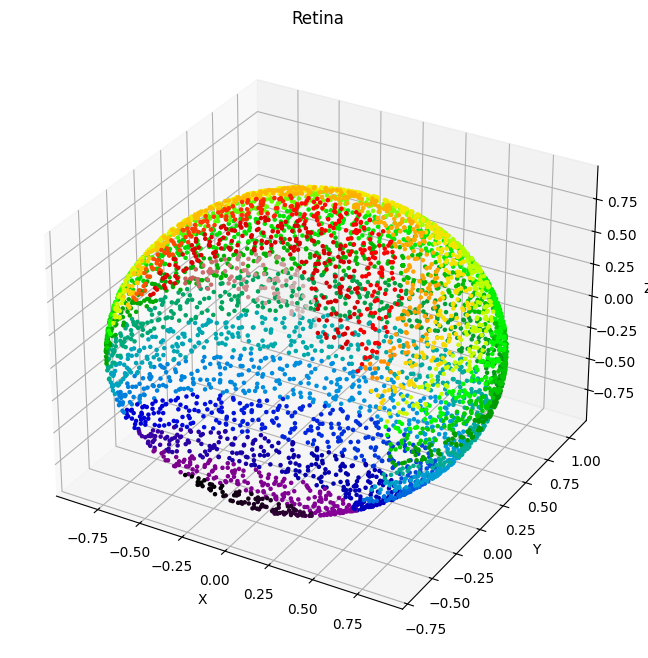

In [45]:
points = uniform_sphere_points(n=5000, r=1.0, cut=0.4, noise=0.02, plot=False)

RES = 16 
mapping = map_neurons_to_grid_sections(
    neuron_positions=points,
    grid_resolution=RES,
    fov_radius=1.0,
    cut=0.4
)

visualize_retina_sections(points, mapping, RES)

grid_map = mapping['grid_map']
total_pixels = RES * RES
active_pixels = len(grid_map)

if (8, 8) in grid_map:
    neuron_indices = grid_map[(8, 8)]

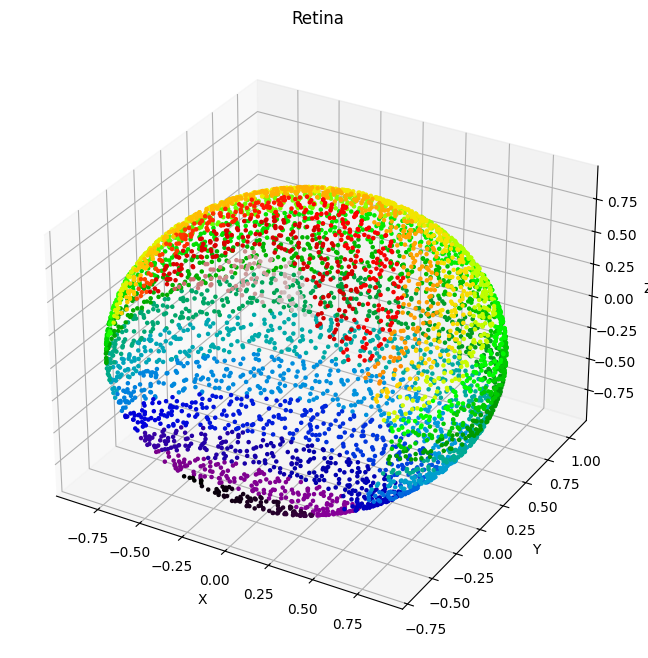

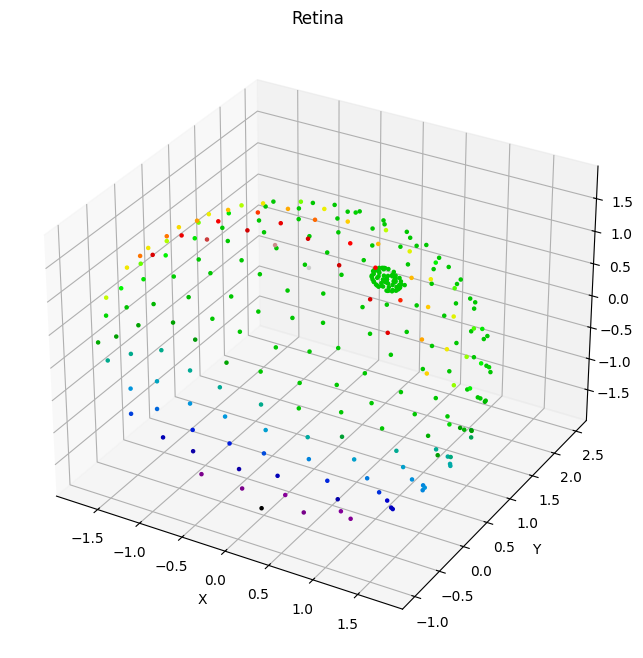

Abdeckung: 133 von 4096 Pixeln getroffen.


In [46]:
points = uniform_sphere_points(n=5000, r=1.0, cut=0.4, noise=0.02)
RES = 16 

mapping = map_neurons_to_grid_sections(points, grid_resolution=RES, fov_radius=1.0, cut=0.4)
visualize_retina_sections(points, mapping, RES)


if 'rods_n_cones' in locals():
   
    p_fovea = rods_n_cones['L_foveola']
    p_periph = rods_n_cones['L_peripheral']
    
    if len(p_fovea) > 0 and len(p_periph) > 0:
        real_points = np.vstack([p_fovea, p_periph])
        
        REAL_RES = 64 
        
        real_mapping = map_neurons_to_grid_sections(
            real_points, 
            grid_resolution=REAL_RES, 
            fov_radius=1.0, 
            cut=0.5
        )
        
        visualize_retina_sections(real_points, real_mapping, REAL_RES)
        
        pixels_hit = len(real_mapping['grid_map'])
        print(f"Abdeckung: {pixels_hit} von {REAL_RES*REAL_RES} Pixeln getroffen.")
    else:
        pass

Start Pipeline for '1.mp4'...
Frame 0: LMS shape (64, 64, 3), Intensity shape (64, 64)
  -> Intensity Min/Max: 0.002 / 0.966


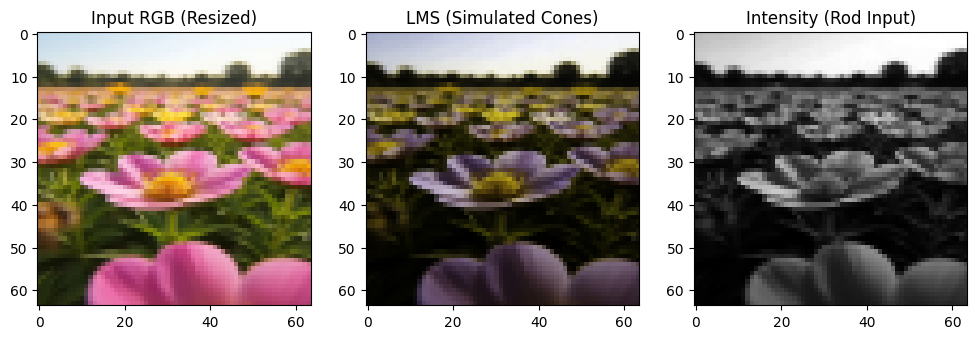

Frame 1: LMS shape (64, 64, 3), Intensity shape (64, 64)
  -> Intensity Min/Max: 0.002 / 0.964
Frame 2: LMS shape (64, 64, 3), Intensity shape (64, 64)
  -> Intensity Min/Max: 0.002 / 0.959


In [47]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def rgb_array_to_lms(rgb_array: np.ndarray, linearize_gamma: bool = True, gamma: float = 2.2) -> np.ndarray:

    if linearize_gamma:
        rgb_array = np.power(rgb_array, gamma)
    

    rgb_to_lms_matrix = np.array([
        [0.31399, 0.63951, 0.04649],  # L
        [0.15537, 0.75789, 0.08670],  # M
        [0.01775, 0.10944, 0.87262],  # S
    ], dtype=np.float32)
    
    lms = rgb_array @ rgb_to_lms_matrix.T
    
    lms = np.clip(lms, 0.0, 1.0)
    
    return lms

def lms_to_intensity(lms_array: np.ndarray) -> np.ndarray:

    intensity = np.mean(lms_array, axis=2)
    intensity = np.clip(intensity, 0.0, 1.0)
    return intensity


def input_pipeline(video_path, target_size=(64, 64)):

    cap = cv2.VideoCapture(video_path)
    
    if not cap.isOpened():
        raise FileNotFoundError(f"Konnte Video '{video_path}' nicht öffnen.")
    
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            
            frame_resized = cv2.resize(frame, target_size, interpolation=cv2.INTER_AREA)
            
            frame_rgb_uint8 = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)
            
            frame_rgb_float = frame_rgb_uint8.astype(np.float32) / 255.0
            
            lms_frame = rgb_array_to_lms(frame_rgb_float, linearize_gamma=True)
            
            intensity_frame = lms_to_intensity(lms_frame)
            
            yield frame_rgb_float, lms_frame, intensity_frame
            
    finally:
        cap.release()


VIDEO_FILE = "1.mp4"
RETINA_SIZE = (64, 64) 
processor = input_pipeline(VIDEO_FILE, target_size=RETINA_SIZE)

print(f"Start Pipeline for '{VIDEO_FILE}'...")

for i, (rgb, lms, intensity) in enumerate(processor):
    
    print(f"Frame {i}: LMS shape {lms.shape}, Intensity shape {intensity.shape}")
    print(f"  -> Intensity Min/Max: {intensity.min():.3f} / {intensity.max():.3f}")
    
    if i == 0:
        fig, ax = plt.subplots(1, 3, figsize=(12, 4))
        
        ax[0].imshow(rgb)
        ax[0].set_title("Input RGB (Resized)")
        
        ax[1].imshow(lms)
        ax[1].set_title("LMS (Simulated Cones)")
        
        ax[2].imshow(intensity, cmap='gray')
        ax[2].set_title("Intensity (Rod Input)")
        
        plt.show()
    
    if i >= 2: 
        break


In [48]:
import cv2
import numpy as np

class RetinaVideoGenerator:
    def __init__(self, video_path: str, target_size=(64, 64), loop: bool = False):

        self.path = video_path
        self.target_size = target_size # (width, height)
        self.loop = loop
        
        self.cap = cv2.VideoCapture(video_path)
        if not self.cap.isOpened():
            raise FileNotFoundError(f"Konnte Video nicht öffnen: {video_path}")
            
        self.fps = self.cap.get(cv2.CAP_PROP_FPS)
        self.total_frames = int(self.cap.get(cv2.CAP_PROP_FRAME_COUNT))
        self.current_frame_idx = 0
        

        self.lms_matrix = np.array([
            [0.31399, 0.63951, 0.04649],  # L
            [0.15537, 0.75789, 0.08670],  # M
            [0.01775, 0.10944, 0.87262],  # S
        ], dtype=np.float32).T

    def __iter__(self):
        return self

    def __next__(self):
        ret, frame = self.cap.read()

        if not ret:
            if self.loop:
                self.reset()
                ret, frame = self.cap.read()
                if not ret: raise StopIteration("Video empty.")
            else:
                raise StopIteration

        self.current_frame_idx += 1

        frame_resized = cv2.resize(frame, self.target_size, interpolation=cv2.INTER_AREA)

        rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

        rgb_linear = np.power(rgb, 2.2)

        lms = rgb_linear @ self.lms_matrix
        lms = np.clip(lms, 0.0, 1.0)

        intensity = np.mean(lms, axis=2)
        
        return rgb, lms, intensity

    def reset(self):
        self.cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
        self.current_frame_idx = 0

    def release(self):
        self.cap.release()
    
    def __del__(self):
        self.release()


gen = RetinaVideoGenerator("1.mp4", target_size=(64, 64), loop=True)

print(f"Video loaded: {gen.fps} FPS, {gen.total_frames} Frames total.")

# 2. Durchlaufen
try:
    for i, (rgb_frame, lms_frame, intensity_frame) in enumerate(gen):
        

        if i % 30 == 0:
            print(f"Verarbeite Frame {i}...")
            print(f"   LMS Shape: {lms_frame.shape}")    
            print(f"   Int Shape: {intensity_frame.shape}")
            
        
        if i >= 100:
            print("Test ended.")
            break

except StopIteration:
    print("Video ended.")
finally:
    gen.release()

Video loaded: 24.0 FPS, 137 Frames total.
Verarbeite Frame 0...
   LMS Shape: (64, 64, 3)
   Int Shape: (64, 64)
Verarbeite Frame 30...
   LMS Shape: (64, 64, 3)
   Int Shape: (64, 64)
Verarbeite Frame 60...
   LMS Shape: (64, 64, 3)
   Int Shape: (64, 64)
Verarbeite Frame 90...
   LMS Shape: (64, 64, 3)
   Int Shape: (64, 64)
Test ended.


# Magno hinzufügen...

In [49]:
populations['parvo_ON_foveal'] = populations['ganglion_ON_foveal']
populations['parvo_OFF_foveal'] = populations['ganglion_OFF_foveal']

magno_params = {
    "C_m": 400.0,      # Größeres Soma
    "g_L": 20.0,       # Schnellere Membranzeitkonstante  
    "E_L": -70.0,
    "V_th": -50.0,     # Niedrigere Schwelle
    "V_reset": -60.0,
    "t_ref": 1.0,      # Kürzere Refraktärzeit
    "a": 2.0,
    "b": 60.0,
    "tau_w": 80.0      # Schnellere Adaptation
}

populations['magno_ON_peripheral'] = nest.Create(
    'aeif_cond_alpha',
    positions=nest.spatial.free(retina['ganglion']['peripheral'].tolist(), edge_wrap=False),
    params=magno_params
)

In [50]:
# PARVO: Enge, präzise Center-Surround (klein, sustained)
parvo_center_mask = nest.CreateMask('spherical', {'radius': 0.08})
parvo_conn = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.04),
    'mask': parvo_center_mask
}

# MAGNO: Große Rezeptive Felder, mehr Konvergenz (transient)
magno_center_mask = nest.CreateMask('spherical', {'radius': 0.35})
magno_conn = {
    'rule': 'pairwise_bernoulli',
    'p': nest.spatial_distributions.gaussian(nest.spatial.distance, std=0.18),
    'mask': magno_center_mask
}

nest.Connect(
    populations['bipolar_ON_peripheral'],
    populations['magno_ON_peripheral'],
    conn_spec=magno_conn,
    syn_spec={'weight': 40.0, 'delay': 0.8}  # Stark, schnell
)


Dec 16 21:31:14 ConnectionManager [Warning]: 
    New connections created, connection descriptors previously obtained using 
    'GetConnections' are now invalid.
